In [1]:
import pandas as pd


## 1. Read Metadata

In [2]:
meta_data = pd.read_csv('../../../For_analysis/RNASequencing/IR3/metaDataIR3.csv')
meta_data

,HudAlphaID,QCflagIR3,Specimen Bar Code,PATNO,GENDER,DIAGNOSIS,CLINICAL_EVENT,Specimen Bar Code.1,Quantity (ug),Concentration (ng/ul),...,MEDIAN_3PRIME_BIAS,NUM_UNEXPLAINED_READS,PCT_RIBOSOMAL_BASES,PCT_INTRONIC_BASES,PCT_R2_TRANSCRIPT_STRAND_READS,PCT_MRNA_BASES,MEDIAN_5PRIME_TO_3PRIME_BIAS,PCT_R1_TRANSCRIPT_STRAND_READS,MEDIAN_5PRIME_BIAS,PCT_USABLE_BASES
0,5104-SL-0001,pass,0000373111,3174,Male,PD,V08,0000373111,1.0,115.90,...,0.845235,1093161,0.0,43.4564,98.1025,50.4726,1.191875,1.8975,1.019442,47.9359
1,5104-SL-0002,pass,PP0016-0526,3201,Female,Control,BL,PP0016-0526,1.0,80.07,...,0.913436,569224,0.0,52.9752,98.1428,40.6987,1.058616,1.8572,0.965040,39.6130
2,5104-SL-0003,pass,0003125874,3057,Female,Control,V06,0003125874,1.0,219.70,...,0.902573,485102,0.0,52.2706,95.4321,36.0884,1.095971,4.5679,0.997003,34.8096
3,5104-SL-0004,pass,0003179818,4126,Male,PD,V04,0003179818,1.0,100.06,...,0.856690,1145227,0.0,45.9355,98.3785,48.3407,1.170152,1.6215,1.013765,45.3119
4,5104-SL-0005,pass,0003164601,4117,Female,PD,BL,0003164601,1.0,124.40,...,0.894656,461631,0.0,58.3984,98.0678,35.8255,1.113733,1.9322,0.985280,34.8793
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4866,5104-SL-4890,pass,0003314545,41314,Female,Genetic Cohort,V02,0003314545,1.0,105.10,...,0.707867,1097837,0.0,41.6055,92.5357,40.2167,1.526826,7.4643,1.086717,36.7253
4867,5104-SL-4891,pass,0003376702,42308,Male,Genetic Cohort,V02,0003376702,1.0,56.09,...,0.719713,775420,0.0,47.0490,97.3024,38.8043,1.269003,2.6976,0.946045,35.5802
4868,5104-SL-4892,pass,0003376763,42306,Male,Genetic Cohort,V02,0003376763,1.0,59.68,...,0.736184,794163,0.0,49.0178,97.0378,38.4877,1.300012,2.9622,0.995326,35.4419
4869,5104-SL-4893,pass,0003203630,1010,Unk,HCPOOL,Unk,0003203630,1.0,50.00,...,0.707379,748803,0.0,40.0865,95.8621,44.4177,1.479038,4.1379,1.031890,41.3555


In [3]:
meta_data.columns

Index(['HudAlphaID', 'QCflagIR3', 'Specimen Bar Code', 'PATNO', 'GENDER',
       'DIAGNOSIS', 'CLINICAL_EVENT', 'Specimen Bar Code.1', 'Quantity (ug)',
       'Concentration (ng/ul)', 'Concentration Flag', 'Submitted Volume (ul)',
       'Normalization Volume (30ng/ul)', 'Total Volume (ul)',
       'Input RNASeq (ng)', 'Input miRNA (ng)', '260/280 Ratio',
       '260/230 Ratio', 'RIN Value', 'BOX', 'POSITION', 'Plate', 'Sample',
       'deletion_length', 'insertion_length', 'mismatch_rate',
       'multimapped_percent', 'uniquely_mapped_percent',
       'num_annotated_splices', 'insertion_rate', 'unmapped_other_percent',
       'multimapped', 'num_splices', 'avg_input_read_length',
       'multimapped_toomany', 'total_reads', 'num_GCAG_splices',
       'unmapped_tooshort', 'unmapped_other', 'unmapped_mismatches_percent',
       'num_noncanonical_splices', 'num_ATAC_splices',
       'multimapped_toomany_percent', 'avg_mapped_read_length',
       'unmapped_mismatches', 'deletion_rate', '

In [4]:
meta_data.PATNO.value_counts()

PATNO
1010     53
1009     53
4104      5
3229      5
3214      5
         ..
42349     1
42298     1
42305     1
42431     1
42312     1
Name: count, Length: 1603, dtype: int64

In [5]:
disease_df = meta_data[['PATNO','DIAGNOSIS']].drop_duplicates()

In [6]:
disease_df.DIAGNOSIS.value_counts()

DIAGNOSIS
Genetic Registry    435
PD                  425
Genetic Cohort      418
Control             196
Prodromal            64
SWEDD                63
PDPOOL                1
HCPOOL                1
Name: count, dtype: int64

In [7]:
import os

In [8]:
l = 0
for i in os.listdir('../../../For_analysis/RNASequencing/IR3/quant/'):
    l = l + 1
    print(i)
    if l==3:
        break

PPMI-Phase2-IR3.3813.V02.PP0013-6148.5104-SL-4635.longRNA-NEBKAP.salmon.genes.sf
PPMI-Phase2-IR3.3481.BL.0003119333.5104-SL-0197.longRNA-NEBKAP.salmon.genes.sf
PPMI-Phase1-IR3.18567.BL.0000302585.5104-SL-1516.longRNA-NEBKAP.salmon.genes.sf


## 2. Read Gene list (Smaller)

In [9]:
gene_excel = pd.ExcelFile('/12tb_dsk3/For_analysis/Modified Master DNA Repair List HN NPM.xlsx')
df2 = pd.read_excel(gene_excel, 'smaller')
df1 = pd.read_excel(gene_excel, 'Integrated stress response')

In [10]:
df2

,Break Induced Replication - Should we omit? this pathway? It would also have a ton of HR proteins involved,,,,Column4,Column5,Column6,Column7,Column8,Column9,...,Column16374,Column16375,Column16376,Column16377,Column16378,Column16379,Column16380,Column16381,Column16382,Column16383
0,NaN,BLM,"BS, MGRISCE1, RECQ2, RECQL2, RECQL3",PMID: 35440629,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,DCLRE1A,"PSO2, SNM1, SNM1A",PMID: 37316655,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,NaN,MCMDC2,6030422M02Rik,GeneCards,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,POLD1,"CDC2, CRCS10, MDPL, POLD",PMID: 24310611,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,NaN,POLD2,-,PMID: 24310611,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
108,NaN,POLK,"DINB1, DINP, POLQ",PMID: 11842189,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
109,NaN,POLN,POL4P,PMID: 16787914,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
110,NaN,POLQ,PRO0327,PMID: 24648516,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
111,NaN,PRIMPOL,"CCDC111, MYP22, Primpol1",PMID: 24240614,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [11]:
gene_list = df2.iloc[:,1].tolist()

In [12]:
import numpy as np
for i in range(100):
    try:
        gene_list.remove(np.nan) # run 4 times
    except:
        break

In [13]:
gene_list = [i.strip() for i in gene_list]

In [14]:
gene_list

['BLM',
 'DCLRE1A',
 'MCMDC2',
 'POLD1',
 'POLD2',
 'POLD3',
 'POLD4',
 'RNF8',
 'APEX1',
 'APEX2',
 'APLF',
 'APTX',
 'ERCC5',
 'FEN1',
 'HPF1',
 'LIG1',
 'LIG3',
 'MBD4',
 'MPG',
 'MUTYH',
 'NEIL1',
 'NEIL2',
 'NEIL3',
 'NTHL1',
 'OGG1',
 'PARP1',
 'PARP2',
 'PNKP',
 'POLB',
 'POLL',
 'POLQ',
 'RAD1',
 'RAD9A',
 'SMUG1',
 'TDG',
 'UNG',
 'XRCC1',
 'APLF',
 'H2AX',
 'DCLRE1C',
 'DTXL3',
 'ERCC1',
 'LIG4',
 'MAD2L2',
 'MRE11',
 'NHEJ1',
 'PARP2',
 'PARP3',
 'PARP9',
 'PNKP',
 'POLA1',
 'POLL',
 'POLM',
 'PRKDC',
 'RAD50',
 'RFC4',
 'RIF1',
 'RNF168',
 'RNF8',
 'SHLD1',
 'SHLD2',
 'SHLD3',
 'TDP1',
 'TP53BP1',
 'XRCC4',
 'XRCC5',
 'XRCC6',
 'CETN2',
 'DDB1',
 'DDB2',
 'ERCC1',
 'ERCC2',
 'ERCC3',
 'ERCC4',
 'ERCC5',
 'ERCC6',
 'ERCC8',
 'GTF2H1',
 'GTF2H2',
 'GTF2H3',
 'GTF2H4',
 'GTF2H5',
 'MMS19',
 'POLD1',
 'POLD2',
 'POLD3',
 'POLE',
 'POLE2',
 'POLE3',
 'POLE4',
 'POLK',
 'RAD23A',
 'RAD23B',
 'RBX1',
 'SLX4',
 'UVSSA',
 'XAB2',
 'XPA',
 'XPC',
 'FAAP20',
 'MAD2L2',
 'REV3L',
 'POL

In [15]:
gene_list = set(gene_list)

In [16]:
len(gene_list )

96

In [17]:

from pybiomart import Server

# Connect to the Ensembl server
server = Server(host='http://www.ensembl.org')
dataset = server.marts['ENSEMBL_MART_ENSEMBL'].datasets['hsapiens_gene_ensembl']  # Replace with your organism

# Query for gene names and Ensembl IDs
# Replace 'BRCA1' with your gene of interest or a list of genes
genes_of_interest = gene_list
query_results = dataset.query(attributes=['external_gene_name', 'ensembl_gene_id'])

# Filter results for your genes of interest
results = query_results[query_results['Gene name'].isin(genes_of_interest)]
print(results)


      Gene name   Gene stable ID
2232     GTF2H1  ENSG00000288114
2238      SHLD1  ENSG00000171984
2974      ERCC5  ENSG00000134899
3129       LIG4  ENSG00000174405
4837       APTX  ENSG00000137074
...         ...              ...
76354     POLE4  ENSG00000115350
81706       XPC  ENSG00000154767
82903    FAAP20  ENSG00000162585
83467     MUTYH  ENSG00000132781
83713    MAD2L2  ENSG00000116670

[107 rows x 2 columns]


In [18]:
set(gene_list) - set(results['Gene name'].tolist())

{'DTXL3'}

In [19]:
set(results['Gene name'].tolist()) - set(gene_list) 

set()

In [20]:
keep_genes = results['Gene stable ID'].tolist()

In [21]:
keep_genes.append('ENSG00000163840')

In [22]:
keep_genes

['ENSG00000288114',
 'ENSG00000171984',
 'ENSG00000134899',
 'ENSG00000174405',
 'ENSG00000137074',
 'ENSG00000291803',
 'ENSG00000291796',
 'ENSG00000042088',
 'ENSG00000196419',
 'ENSG00000166169',
 'ENSG00000119318',
 'ENSG00000292286',
 'ENSG00000005156',
 'ENSG00000100823',
 'ENSG00000155229',
 'ENSG00000112130',
 'ENSG00000113522',
 'ENSG00000101751',
 'ENSG00000077514',
 'ENSG00000169188',
 'ENSG00000101868',
 'ENSG00000129484',
 'ENSG00000225830',
 'ENSG00000122376',
 'ENSG00000152422',
 'ENSG00000073050',
 'ENSG00000100387',
 'ENSG00000147400',
 'ENSG00000179262',
 'ENSG00000163961',
 'ENSG00000213780',
 'ENSG00000276910',
 'ENSG00000122678',
 'ENSG00000168496',
 'ENSG00000275045',
 'ENSG00000039650',
 'ENSG00000198924',
 'ENSG00000164306',
 'ENSG00000170734',
 'ENSG00000148229',
 'ENSG00000163945',
 'ENSG00000111358',
 'ENSG00000292191',
 'ENSG00000175482',
 'ENSG00000076924',
 'ENSG00000226384',
 'ENSG00000049167',
 'ENSG00000236895',
 'ENSG00000056050',
 'ENSG00000234370',


In [23]:
len(set(keep_genes))

108

In [24]:
len(set(results['Gene name'].tolist()))

95

In [25]:
n=set(results['Gene name'].tolist())

In [26]:
results['Gene name'].value_counts()

Gene name
GTF2H4    6
GTF2H2    3
CETN2     2
GTF2H1    2
PARP2     2
         ..
FEN1      1
POLM      1
RNF168    1
RAD23A    1
POLD4     1
Name: count, Length: 95, dtype: int64

## 3. Read RNA seq (count normalized)

In [27]:
sample_3813 = pd.read_csv('../../../For_analysis/RNASequencing/IR3/quant/PPMI-Phase2-IR3.3813.V02.PP0013-6148.5104-SL-4635.longRNA-NEBKAP.salmon.genes.sf' ,sep = '\t')
m = [i.split('.')[0] for i in sample_3813.Name.tolist()]

In [28]:
len(m)

58294

In [29]:
keep_genes = list(set(m).intersection(keep_genes))

In [30]:
keep_genes

['ENSG00000106628',
 'ENSG00000188827',
 'ENSG00000100479',
 'ENSG00000166169',
 'ENSG00000041880',
 'ENSG00000163840',
 'ENSG00000140398',
 'ENSG00000175595',
 'ENSG00000020922',
 'ENSG00000170734',
 'ENSG00000009413',
 'ENSG00000164306',
 'ENSG00000104884',
 'ENSG00000187736',
 'ENSG00000253729',
 'ENSG00000172613',
 'ENSG00000154767',
 'ENSG00000167986',
 'ENSG00000056050',
 'ENSG00000067369',
 'ENSG00000147400',
 'ENSG00000070501',
 'ENSG00000225830',
 'ENSG00000122008',
 'ENSG00000109674',
 'ENSG00000178460',
 'ENSG00000188486',
 'ENSG00000123415',
 'ENSG00000174405',
 'ENSG00000119318',
 'ENSG00000005156',
 'ENSG00000135945',
 'ENSG00000143799',
 'ENSG00000062822',
 'ENSG00000198924',
 'ENSG00000134574',
 'ENSG00000100387',
 'ENSG00000051341',
 'ENSG00000163161',
 'ENSG00000042088',
 'ENSG00000129071',
 'ENSG00000145736',
 'ENSG00000079246',
 'ENSG00000175482',
 'ENSG00000163961',
 'ENSG00000197299',
 'ENSG00000076248',
 'ENSG00000110768',
 'ENSG00000253251',
 'ENSG00000169188',


In [31]:
len(keep_genes)

96

In [32]:
l = 0
from tqdm import tqdm
data = pd.DataFrame(columns=keep_genes)
for i in tqdm(os.listdir('../../../For_analysis/RNASequencing/IR3/quant/')):
    if 'genes' not in i:
        continue
    
    read_file_path = '../../../For_analysis/RNASequencing/IR3/quant/'+ str(i)
    df = pd.read_csv(read_file_path ,sep = '\t')
    #print(df.head())
    m = [i.split('.')[0] for i in df.Name.tolist()]
    df['Name'] = m 
    df = df.rename(columns={'TPM': i})
    #print(df.head())
    df = df.set_index('Name')[[i]].T
    
    df = df[keep_genes]
    #print(df.head())
    data = pd.concat([data,df])


  0%|                                                                                                                                         | 0/9513 [00:00<?, ?it/s]/tmp/ipykernel_122617/3419326005.py:19: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  data = pd.concat([data,df])
100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9513/9513 [01:59<00:00, 79.52it/s]


In [33]:
data.sort_index()

,ENSG00000106628,ENSG00000188827,ENSG00000100479,ENSG00000166169,ENSG00000041880,ENSG00000163840,ENSG00000140398,ENSG00000175595,ENSG00000020922,ENSG00000170734,...,ENSG00000101751,ENSG00000162585,ENSG00000073050,ENSG00000103152,ENSG00000065057,ENSG00000101868,ENSG00000154328,ENSG00000171984,ENSG00000169621,ENSG00000112130
PPMI-Phase1-IR3.1009.POOL.0003202425.5104-SL-0095.longRNA-NEBKAP.salmon.genes.sf,5.008220,2.006420,3.54462,15.73820,2.293250,21.76560,4.34593,8.00183,20.48370,3.27972,...,25.6672,6.44212,5.91273,9.93633,4.79102,4.61378,3.957140,16.54540,2.91891,6.01097
PPMI-Phase1-IR3.1009.POOL.0003202427.5104-SL-0287.longRNA-NEBKAP.salmon.genes.sf,1.547300,0.565336,2.59771,5.96298,0.639648,12.19470,2.58527,3.91259,13.78630,3.39719,...,13.8744,2.58913,1.24389,5.82284,2.38693,2.43388,2.265990,7.30665,1.94903,3.51175
PPMI-Phase1-IR3.1009.POOL.0003202429.5104-SL-0479.longRNA-NEBKAP.salmon.genes.sf,1.919290,1.059810,3.96168,7.61139,1.021100,15.60500,2.79138,4.98165,19.25540,2.21053,...,18.8283,4.26756,2.25081,8.45608,3.22989,4.36216,2.578720,11.63130,2.51937,4.11629
PPMI-Phase1-IR3.1009.POOL.0003202431.5104-SL-0671.longRNA-NEBKAP.salmon.genes.sf,1.813480,0.958297,2.93541,7.12734,0.646968,14.48910,3.05775,6.49789,17.83180,1.88651,...,18.8816,4.09929,1.93420,7.20920,3.09493,2.59135,2.826950,9.55217,2.54169,4.03744
PPMI-Phase1-IR3.1009.POOL.0003202432.5104-SL-0767.longRNA-NEBKAP.salmon.genes.sf,1.854560,0.883796,2.90128,7.49113,0.940300,16.96730,4.42491,5.81512,19.24730,2.61368,...,20.6452,3.67963,1.68588,7.05292,3.07970,3.79491,2.677150,11.23320,2.29065,4.54606
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
PPMI-Phase2-IR3.92490.V02.0000377639.5104-SL-2827.longRNA-NEBKAP.salmon.genes.sf,0.849270,0.472918,1.70509,3.86345,0.585427,10.23520,2.44723,3.50215,10.12870,2.41474,...,15.2039,2.39466,1.30725,5.98362,1.68283,1.20550,1.105020,4.41464,1.34952,2.21288
PPMI-Phase2-IR3.92490.V04.0001176681.5104-SL-2875.longRNA-NEBKAP.salmon.genes.sf,2.224240,1.167150,3.27892,10.78710,1.067580,17.28480,4.10078,4.93133,11.93790,2.50729,...,17.2858,3.30317,2.76811,6.73702,2.62166,2.01351,2.883040,10.16710,2.17777,2.50749
PPMI-Phase2-IR3.92490.V06.0003173298.5104-SL-2868.longRNA-NEBKAP.salmon.genes.sf,2.316760,1.017460,3.03692,7.89580,0.772079,16.17870,4.63534,4.47033,13.87330,2.24458,...,21.3486,3.74515,2.64938,7.95183,2.70892,2.36565,2.102580,9.25389,1.92099,2.94560
PPMI-Phase2-IR3.92834.V02.0001093148.5104-SL-4064.longRNA-NEBKAP.salmon.genes.sf,0.627200,0.404234,3.92107,6.43796,0.536731,11.97360,1.50860,3.46593,12.43350,1.65917,...,12.8731,2.33092,1.30144,6.61741,1.34723,2.48421,1.618010,11.71410,1.99434,2.49195


In [34]:
meta_data

,HudAlphaID,QCflagIR3,Specimen Bar Code,PATNO,GENDER,DIAGNOSIS,CLINICAL_EVENT,Specimen Bar Code.1,Quantity (ug),Concentration (ng/ul),...,MEDIAN_3PRIME_BIAS,NUM_UNEXPLAINED_READS,PCT_RIBOSOMAL_BASES,PCT_INTRONIC_BASES,PCT_R2_TRANSCRIPT_STRAND_READS,PCT_MRNA_BASES,MEDIAN_5PRIME_TO_3PRIME_BIAS,PCT_R1_TRANSCRIPT_STRAND_READS,MEDIAN_5PRIME_BIAS,PCT_USABLE_BASES
0,5104-SL-0001,pass,0000373111,3174,Male,PD,V08,0000373111,1.0,115.90,...,0.845235,1093161,0.0,43.4564,98.1025,50.4726,1.191875,1.8975,1.019442,47.9359
1,5104-SL-0002,pass,PP0016-0526,3201,Female,Control,BL,PP0016-0526,1.0,80.07,...,0.913436,569224,0.0,52.9752,98.1428,40.6987,1.058616,1.8572,0.965040,39.6130
2,5104-SL-0003,pass,0003125874,3057,Female,Control,V06,0003125874,1.0,219.70,...,0.902573,485102,0.0,52.2706,95.4321,36.0884,1.095971,4.5679,0.997003,34.8096
3,5104-SL-0004,pass,0003179818,4126,Male,PD,V04,0003179818,1.0,100.06,...,0.856690,1145227,0.0,45.9355,98.3785,48.3407,1.170152,1.6215,1.013765,45.3119
4,5104-SL-0005,pass,0003164601,4117,Female,PD,BL,0003164601,1.0,124.40,...,0.894656,461631,0.0,58.3984,98.0678,35.8255,1.113733,1.9322,0.985280,34.8793
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4866,5104-SL-4890,pass,0003314545,41314,Female,Genetic Cohort,V02,0003314545,1.0,105.10,...,0.707867,1097837,0.0,41.6055,92.5357,40.2167,1.526826,7.4643,1.086717,36.7253
4867,5104-SL-4891,pass,0003376702,42308,Male,Genetic Cohort,V02,0003376702,1.0,56.09,...,0.719713,775420,0.0,47.0490,97.3024,38.8043,1.269003,2.6976,0.946045,35.5802
4868,5104-SL-4892,pass,0003376763,42306,Male,Genetic Cohort,V02,0003376763,1.0,59.68,...,0.736184,794163,0.0,49.0178,97.0378,38.4877,1.300012,2.9622,0.995326,35.4419
4869,5104-SL-4893,pass,0003203630,1010,Unk,HCPOOL,Unk,0003203630,1.0,50.00,...,0.707379,748803,0.0,40.0865,95.8621,44.4177,1.479038,4.1379,1.031890,41.3555


In [35]:
l

0

In [36]:
l = data.index.tolist()
patient_no = [i.split('.')[1] for i in l]
time_point = [i.split('.')[2] for i in l]

In [37]:
data['Patient_Name'] = patient_no 
data['Time_Point'] = time_point

In [38]:
col_index= ['Patient_Name',
 'Time_Point']+ data.columns.tolist()[0:-2]

In [39]:
data = data[col_index]

In [40]:
data = data.sort_values(by = 'Patient_Name', axis = 0)

In [41]:
data

,Patient_Name,Time_Point,ENSG00000106628,ENSG00000188827,ENSG00000100479,ENSG00000166169,ENSG00000041880,ENSG00000163840,ENSG00000140398,ENSG00000175595,...,ENSG00000101751,ENSG00000162585,ENSG00000073050,ENSG00000103152,ENSG00000065057,ENSG00000101868,ENSG00000154328,ENSG00000171984,ENSG00000169621,ENSG00000112130
PPMI-Phase1-IR3.1009.POOL.0003202438.5104-SL-1343.longRNA-NEBKAP.salmon.genes.sf,1009,POOL,2.464370,0.845434,3.73374,6.81831,0.690326,15.05640,2.947880,6.13203,...,18.84080,3.26722,1.715460,7.05809,3.571490,2.77440,2.816450,8.04659,1.911440,3.55863
PPMI-Phase1-IR3.1009.POOL.0003202431.5104-SL-0671.longRNA-NEBKAP.salmon.genes.sf,1009,POOL,1.813480,0.958297,2.93541,7.12734,0.646968,14.48910,3.057750,6.49789,...,18.88160,4.09929,1.934200,7.20920,3.094930,2.59135,2.826950,9.55217,2.541690,4.03744
PPMI-Phase2-IR3.1009.POOL.0003203727.5104-SL-4014.longRNA-NEBKAP.salmon.genes.sf,1009,POOL,2.157130,0.780976,3.26764,7.08097,1.028800,14.86930,3.635480,5.68342,...,16.88150,2.88465,2.325400,8.20329,2.916590,3.49612,3.009420,10.39400,2.363780,5.06066
PPMI-Phase2-IR3.1009.POOL.0003202434.5104-SL-0959.longRNA-NEBKAP.salmon.genes.sf,1009,POOL,0.668340,0.434014,1.90298,3.47971,0.339157,6.65433,1.542740,2.80414,...,8.17464,1.29347,0.787507,2.51548,1.335670,1.45155,1.109630,4.77347,0.812515,1.61910
PPMI-Phase1-IR3.1009.POOL.0003202442.5104-SL-1719.longRNA-NEBKAP.salmon.genes.sf,1009,POOL,2.105140,0.880213,3.70556,7.06285,0.591252,14.28090,4.033380,6.63284,...,17.48600,2.95435,1.805160,7.69907,3.261070,3.56356,2.363740,10.88400,2.431300,4.90965
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
PPMI-Phase2-IR3.92490.V06.0003173298.5104-SL-2868.longRNA-NEBKAP.salmon.genes.sf,92490,V06,2.316760,1.017460,3.03692,7.89580,0.772079,16.17870,4.635340,4.47033,...,21.34860,3.74515,2.649380,7.95183,2.708920,2.36565,2.102580,9.25389,1.920990,2.94560
PPMI-Phase2-IR3.92490.V02.0000377639.5104-SL-2827.longRNA-NEBKAP.salmon.genes.sf,92490,V02,0.849270,0.472918,1.70509,3.86345,0.585427,10.23520,2.447230,3.50215,...,15.20390,2.39466,1.307250,5.98362,1.682830,1.20550,1.105020,4.41464,1.349520,2.21288
PPMI-Phase1-IR3.92834.BL.0000286784.5104-SL-0950.longRNA-NEBKAP.salmon.genes.sf,92834,BL,0.420940,0.101856,1.18466,4.87360,0.195616,3.64736,0.526451,1.74759,...,3.77802,1.38823,0.783153,2.97066,0.970624,0.55932,0.706022,3.58886,0.699596,1.10919
PPMI-Phase2-IR3.92834.V02.0001093148.5104-SL-4064.longRNA-NEBKAP.salmon.genes.sf,92834,V02,0.627200,0.404234,3.92107,6.43796,0.536731,11.97360,1.508600,3.46593,...,12.87310,2.33092,1.301440,6.61741,1.347230,2.48421,1.618010,11.71410,1.994340,2.49195


In [42]:
data.to_csv('../../../For_analysis/smaller_response_expression.csv',index = False)

In [43]:
temp_meta = meta_data[['PATNO','DIAGNOSIS']].drop_duplicates()

In [44]:
temp_meta.PATNO = temp_meta.PATNO.astype(str)

In [45]:
data = pd.merge(data,temp_meta, left_on = 'Patient_Name', right_on = 'PATNO')

In [46]:
keep_columns = ['DIAGNOSIS'] + data.columns.tolist()[0:-2]

In [47]:
data = data[keep_columns]

In [48]:
data

,DIAGNOSIS,Patient_Name,Time_Point,ENSG00000106628,ENSG00000188827,ENSG00000100479,ENSG00000166169,ENSG00000041880,ENSG00000163840,ENSG00000140398,...,ENSG00000101751,ENSG00000162585,ENSG00000073050,ENSG00000103152,ENSG00000065057,ENSG00000101868,ENSG00000154328,ENSG00000171984,ENSG00000169621,ENSG00000112130
0,PDPOOL,1009,POOL,2.464370,0.845434,3.73374,6.81831,0.690326,15.05640,2.947880,...,18.84080,3.26722,1.715460,7.05809,3.571490,2.77440,2.816450,8.04659,1.911440,3.55863
1,PDPOOL,1009,POOL,1.813480,0.958297,2.93541,7.12734,0.646968,14.48910,3.057750,...,18.88160,4.09929,1.934200,7.20920,3.094930,2.59135,2.826950,9.55217,2.541690,4.03744
2,PDPOOL,1009,POOL,2.157130,0.780976,3.26764,7.08097,1.028800,14.86930,3.635480,...,16.88150,2.88465,2.325400,8.20329,2.916590,3.49612,3.009420,10.39400,2.363780,5.06066
3,PDPOOL,1009,POOL,0.668340,0.434014,1.90298,3.47971,0.339157,6.65433,1.542740,...,8.17464,1.29347,0.787507,2.51548,1.335670,1.45155,1.109630,4.77347,0.812515,1.61910
4,PDPOOL,1009,POOL,2.105140,0.880213,3.70556,7.06285,0.591252,14.28090,4.033380,...,17.48600,2.95435,1.805160,7.69907,3.261070,3.56356,2.363740,10.88400,2.431300,4.90965
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4739,Prodromal,92490,V06,2.316760,1.017460,3.03692,7.89580,0.772079,16.17870,4.635340,...,21.34860,3.74515,2.649380,7.95183,2.708920,2.36565,2.102580,9.25389,1.920990,2.94560
4740,Prodromal,92490,V02,0.849270,0.472918,1.70509,3.86345,0.585427,10.23520,2.447230,...,15.20390,2.39466,1.307250,5.98362,1.682830,1.20550,1.105020,4.41464,1.349520,2.21288
4741,Prodromal,92834,BL,0.420940,0.101856,1.18466,4.87360,0.195616,3.64736,0.526451,...,3.77802,1.38823,0.783153,2.97066,0.970624,0.55932,0.706022,3.58886,0.699596,1.10919
4742,Prodromal,92834,V02,0.627200,0.404234,3.92107,6.43796,0.536731,11.97360,1.508600,...,12.87310,2.33092,1.301440,6.61741,1.347230,2.48421,1.618010,11.71410,1.994340,2.49195


In [49]:
data = data[data.DIAGNOSIS.isin(['PD','Control','Prodromal'])]

In [50]:
data

,DIAGNOSIS,Patient_Name,Time_Point,ENSG00000106628,ENSG00000188827,ENSG00000100479,ENSG00000166169,ENSG00000041880,ENSG00000163840,ENSG00000140398,...,ENSG00000101751,ENSG00000162585,ENSG00000073050,ENSG00000103152,ENSG00000065057,ENSG00000101868,ENSG00000154328,ENSG00000171984,ENSG00000169621,ENSG00000112130
106,Prodromal,10874,V06,2.989370,0.927779,2.35227,7.42344,0.714388,17.46930,4.475710,...,18.80840,3.30373,1.278340,7.52252,2.689440,4.26902,2.390270,9.22908,2.254970,5.25961
107,Prodromal,10874,BL,1.603190,0.489436,2.72104,6.59801,0.879512,17.11270,3.905670,...,18.44370,3.69970,1.858240,12.02160,5.110330,3.16786,2.994620,10.62050,2.134790,5.84368
108,Prodromal,10874,V04,3.430250,1.289410,3.36163,8.84599,0.940890,21.15670,4.450270,...,19.18010,3.27629,2.005750,7.18883,2.828510,3.82148,3.094450,9.52624,2.396890,4.95732
109,Prodromal,10874,V02,3.604610,1.232200,2.81718,6.98435,1.453630,17.81850,7.211560,...,19.43140,5.33043,2.705970,8.03343,3.271430,4.47624,2.648080,9.72919,3.125140,5.54994
110,Prodromal,12224,V08,3.130320,0.986279,4.15309,8.29633,1.317460,13.88870,3.876460,...,21.39540,4.20398,1.938890,10.71160,4.688890,6.14695,3.530590,16.25590,3.567250,7.43943
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4739,Prodromal,92490,V06,2.316760,1.017460,3.03692,7.89580,0.772079,16.17870,4.635340,...,21.34860,3.74515,2.649380,7.95183,2.708920,2.36565,2.102580,9.25389,1.920990,2.94560
4740,Prodromal,92490,V02,0.849270,0.472918,1.70509,3.86345,0.585427,10.23520,2.447230,...,15.20390,2.39466,1.307250,5.98362,1.682830,1.20550,1.105020,4.41464,1.349520,2.21288
4741,Prodromal,92834,BL,0.420940,0.101856,1.18466,4.87360,0.195616,3.64736,0.526451,...,3.77802,1.38823,0.783153,2.97066,0.970624,0.55932,0.706022,3.58886,0.699596,1.10919
4742,Prodromal,92834,V02,0.627200,0.404234,3.92107,6.43796,0.536731,11.97360,1.508600,...,12.87310,2.33092,1.301440,6.61741,1.347230,2.48421,1.618010,11.71410,1.994340,2.49195


In [51]:
data.columns

Index(['DIAGNOSIS', 'Patient_Name', 'Time_Point', 'ENSG00000106628',
       'ENSG00000188827', 'ENSG00000100479', 'ENSG00000166169',
       'ENSG00000041880', 'ENSG00000163840', 'ENSG00000140398',
       'ENSG00000175595', 'ENSG00000020922', 'ENSG00000170734',
       'ENSG00000009413', 'ENSG00000164306', 'ENSG00000104884',
       'ENSG00000187736', 'ENSG00000253729', 'ENSG00000172613',
       'ENSG00000154767', 'ENSG00000167986', 'ENSG00000056050',
       'ENSG00000067369', 'ENSG00000147400', 'ENSG00000070501',
       'ENSG00000225830', 'ENSG00000122008', 'ENSG00000109674',
       'ENSG00000178460', 'ENSG00000188486', 'ENSG00000123415',
       'ENSG00000174405', 'ENSG00000119318', 'ENSG00000005156',
       'ENSG00000135945', 'ENSG00000143799', 'ENSG00000062822',
       'ENSG00000198924', 'ENSG00000134574', 'ENSG00000100387',
       'ENSG00000051341', 'ENSG00000163161', 'ENSG00000042088',
       'ENSG00000129071', 'ENSG00000145736', 'ENSG00000079246',
       'ENSG00000175482', 'ENSG0000

In [52]:
# comparing control vs all time

In [53]:
data.DIAGNOSIS.value_counts()

DIAGNOSIS
PD           1716
Control       869
Prodromal     254
Name: count, dtype: int64

### 4. Splitting into Control, PD and Prodromal

In [54]:
Control_sample = data[data.DIAGNOSIS == 'Control']
Control_sample.Time_Point.value_counts()

Time_Point
BL     189
V04    179
V02    177
V06    165
V08    159
Name: count, dtype: int64

In [55]:
PD_sample = data[data.DIAGNOSIS == 'PD']
PD_sample.Time_Point.value_counts()

Time_Point
BL     393
V04    354
V06    352
V08    340
V02    277
Name: count, dtype: int64

In [56]:
Prodromal_sample = data[data.DIAGNOSIS == 'Prodromal']
Prodromal_sample.Time_Point.value_counts()

Time_Point
V04    59
V02    59
V06    58
BL     58
V08    20
Name: count, dtype: int64

In [57]:
Control_sample = Control_sample.reset_index(drop=True)
Control_sample 

,DIAGNOSIS,Patient_Name,Time_Point,ENSG00000106628,ENSG00000188827,ENSG00000100479,ENSG00000166169,ENSG00000041880,ENSG00000163840,ENSG00000140398,...,ENSG00000101751,ENSG00000162585,ENSG00000073050,ENSG00000103152,ENSG00000065057,ENSG00000101868,ENSG00000154328,ENSG00000171984,ENSG00000169621,ENSG00000112130
0,Control,3000,V02,1.495860,0.414523,1.033120,3.30683,0.465131,13.03450,3.437500,...,12.91010,2.57548,1.598900,6.65970,3.14440,2.26597,2.611500,7.64570,1.816540,4.58058
1,Control,3000,V06,1.753050,0.559310,2.519230,3.66835,0.717081,17.24090,2.879770,...,23.91090,2.86258,1.768280,8.28117,2.73662,3.02409,3.048670,8.52231,2.146120,4.94069
2,Control,3000,V04,2.943720,0.911370,2.141810,3.56752,1.234170,15.57750,5.084040,...,21.57220,2.90540,2.112480,7.68582,4.00779,4.92258,3.804090,9.40067,2.398330,6.74424
3,Control,3000,V08,2.159880,0.815120,1.966040,5.27252,0.575128,14.86750,3.181440,...,23.25800,2.65264,2.112440,7.19376,2.96452,3.81693,4.048880,10.66270,2.360500,5.58921
4,Control,3000,BL,3.867260,1.170490,3.266080,8.53968,1.579500,17.98060,5.294410,...,18.77460,2.91078,3.102120,7.80747,4.17145,3.60959,4.661660,15.00090,2.828040,5.48448
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
864,Control,4118,BL,2.762360,1.395300,2.542770,6.34842,1.129590,15.70160,3.125260,...,16.93090,1.86260,1.788890,5.69923,2.46703,4.28955,3.409960,11.75870,2.333750,4.91262
865,Control,4118,V02,2.945870,1.379120,1.209620,7.68563,1.065040,22.20800,5.942870,...,30.08220,3.79061,2.569420,10.47440,3.77496,5.31909,3.742170,15.49570,3.431860,5.76425
866,Control,4139,BL,1.252420,0.389260,2.337370,5.15694,1.140460,9.05135,2.411300,...,12.54990,3.09135,2.062970,9.28729,2.91125,2.12892,1.741510,8.43322,1.645720,2.78234
867,Control,4139,V04,4.503860,2.295130,1.810030,16.42440,2.086620,15.87400,8.216330,...,12.68490,7.52704,6.049210,9.85403,3.47023,1.79237,2.370610,9.18018,2.392470,2.34226


In [58]:
Prodromal_sample = Prodromal_sample.reset_index(drop=True)
Prodromal_sample

,DIAGNOSIS,Patient_Name,Time_Point,ENSG00000106628,ENSG00000188827,ENSG00000100479,ENSG00000166169,ENSG00000041880,ENSG00000163840,ENSG00000140398,...,ENSG00000101751,ENSG00000162585,ENSG00000073050,ENSG00000103152,ENSG00000065057,ENSG00000101868,ENSG00000154328,ENSG00000171984,ENSG00000169621,ENSG00000112130
0,Prodromal,10874,V06,2.989370,0.927779,2.35227,7.42344,0.714388,17.46930,4.475710,...,18.80840,3.30373,1.278340,7.52252,2.689440,4.26902,2.390270,9.22908,2.254970,5.25961
1,Prodromal,10874,BL,1.603190,0.489436,2.72104,6.59801,0.879512,17.11270,3.905670,...,18.44370,3.69970,1.858240,12.02160,5.110330,3.16786,2.994620,10.62050,2.134790,5.84368
2,Prodromal,10874,V04,3.430250,1.289410,3.36163,8.84599,0.940890,21.15670,4.450270,...,19.18010,3.27629,2.005750,7.18883,2.828510,3.82148,3.094450,9.52624,2.396890,4.95732
3,Prodromal,10874,V02,3.604610,1.232200,2.81718,6.98435,1.453630,17.81850,7.211560,...,19.43140,5.33043,2.705970,8.03343,3.271430,4.47624,2.648080,9.72919,3.125140,5.54994
4,Prodromal,12224,V08,3.130320,0.986279,4.15309,8.29633,1.317460,13.88870,3.876460,...,21.39540,4.20398,1.938890,10.71160,4.688890,6.14695,3.530590,16.25590,3.567250,7.43943
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
249,Prodromal,92490,V06,2.316760,1.017460,3.03692,7.89580,0.772079,16.17870,4.635340,...,21.34860,3.74515,2.649380,7.95183,2.708920,2.36565,2.102580,9.25389,1.920990,2.94560
250,Prodromal,92490,V02,0.849270,0.472918,1.70509,3.86345,0.585427,10.23520,2.447230,...,15.20390,2.39466,1.307250,5.98362,1.682830,1.20550,1.105020,4.41464,1.349520,2.21288
251,Prodromal,92834,BL,0.420940,0.101856,1.18466,4.87360,0.195616,3.64736,0.526451,...,3.77802,1.38823,0.783153,2.97066,0.970624,0.55932,0.706022,3.58886,0.699596,1.10919
252,Prodromal,92834,V02,0.627200,0.404234,3.92107,6.43796,0.536731,11.97360,1.508600,...,12.87310,2.33092,1.301440,6.61741,1.347230,2.48421,1.618010,11.71410,1.994340,2.49195


In [59]:
PD_sample = PD_sample.reset_index(drop=True)
PD_sample 

,DIAGNOSIS,Patient_Name,Time_Point,ENSG00000106628,ENSG00000188827,ENSG00000100479,ENSG00000166169,ENSG00000041880,ENSG00000163840,ENSG00000140398,...,ENSG00000101751,ENSG00000162585,ENSG00000073050,ENSG00000103152,ENSG00000065057,ENSG00000101868,ENSG00000154328,ENSG00000171984,ENSG00000169621,ENSG00000112130
0,PD,3001,BL,1.129890,0.254305,2.213760,3.21522,0.430402,7.48539,2.171860,...,8.83828,1.44686,1.269090,3.65666,1.69137,1.65486,1.33590,6.27693,1.403180,2.71499
1,PD,3001,V02,2.472280,0.648618,2.357690,4.01858,0.738716,14.79670,3.827620,...,21.39880,3.04737,2.179590,8.08641,3.73025,3.24648,2.56296,11.82320,2.945720,5.99576
2,PD,3001,V06,1.814930,0.609645,3.391130,3.54482,0.919483,9.55244,2.313320,...,8.93784,2.66170,1.533490,4.90196,1.58926,1.72921,2.15286,6.09991,1.608010,3.81489
3,PD,3001,V08,0.801529,0.422837,0.874733,3.67784,0.537814,7.62637,2.050320,...,6.86860,1.24737,1.070490,2.83105,1.21562,1.54987,1.23395,4.76580,0.947044,2.21507
4,PD,3001,V04,1.861710,0.460042,2.432370,5.37326,0.567266,14.02450,4.594970,...,13.66990,2.69486,2.041370,8.04223,3.21745,4.06360,3.11863,8.78628,2.008680,4.58911
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1711,PD,4135,V04,0.510542,0.189686,6.099980,2.46068,0.268313,8.07389,0.514299,...,17.48760,1.05773,0.534216,3.63522,1.02701,2.37872,1.86844,3.41516,2.222140,2.37681
1712,PD,4135,V02,1.783470,1.448190,4.132740,14.15850,0.965994,35.73350,4.519910,...,36.68900,4.15344,3.358650,7.63754,3.46470,5.07556,5.77210,15.01390,4.401980,4.93233
1713,PD,4136,V06,1.793510,0.518311,1.780160,8.41037,1.114430,14.73860,2.372060,...,12.19080,3.24639,1.097350,10.03960,4.82573,2.80103,3.57744,11.43080,2.141310,4.19747
1714,PD,4136,BL,3.057830,1.703960,4.134940,12.50240,2.117610,21.62600,4.358550,...,11.96880,4.27696,3.600680,8.25585,4.50619,3.38613,4.48547,16.91200,2.726140,4.17762


In [60]:
elements = list(set(data.Time_Point))

In [61]:
import itertools

# Define the list


# Generate all combinations of 2 including reverse pairs
combinations_with_reverse = list(itertools.product(elements, repeat=2))

# Print the result
for combo in combinations_with_reverse:
    print(combo)


('V06', 'V06')
('V06', 'V08')
('V06', 'V04')
('V06', 'BL')
('V06', 'V02')
('V08', 'V06')
('V08', 'V08')
('V08', 'V04')
('V08', 'BL')
('V08', 'V02')
('V04', 'V06')
('V04', 'V08')
('V04', 'V04')
('V04', 'BL')
('V04', 'V02')
('BL', 'V06')
('BL', 'V08')
('BL', 'V04')
('BL', 'BL')
('BL', 'V02')
('V02', 'V06')
('V02', 'V08')
('V02', 'V04')
('V02', 'BL')
('V02', 'V02')


### 5. all combination Control vs PRODROMAL (Logistic Regression)
#####   i.) Run 1000 times to calculate avg feature importance of each genes

In [67]:
import numpy as np
import pandas as pd
from sklearn.feature_selection import RFE
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, roc_auc_score, precision_score, recall_score, f1_score
import random
from itertools import product  # assuming combinations_with_reverse is some kind of product

ACCURACY_DICT = dict()
MAX_SAMPLES = dict()
FEATURE_IMPORTANCES = dict()

F1_SCORES = dict()
PRECISION_SCORES = dict()
RECALL_SCORES = dict()
AUC_SCORES = dict()

for combo in tqdm(combinations_with_reverse):
    
    Prodromal_sample_ = Prodromal_sample[Prodromal_sample.Time_Point== combo[0]].iloc[:,3:]
    Prodromal_sample_ = Prodromal_sample_.reset_index(drop = True)
    
    Control_sample_ = Control_sample[Control_sample.Time_Point== combo[1]].iloc[:,3:]
    Control_sample_ = Control_sample_.reset_index(drop = True)

    
    accuracies_temp = []
    auc_scores = []
    precision_scores = []
    recall_scores = []
    f1_scores = []
    
    for i in range(1000):
        
        max_num = min(len(Prodromal_sample_),len(Control_sample_))
        
        random_numbers = random.sample(range(0, max_num), max_num)
        
        Prodromal_sample_temp = Prodromal_sample_.iloc[random_numbers,:]
        
        Control_sample_temp = Control_sample_.iloc[random_numbers,:]

        if i ==0:
            print(len(Prodromal_sample_temp))
            print(len(Control_sample_temp))
        X = pd.concat([Prodromal_sample_temp,Control_sample_temp])
        
        y = [0 for i in range(len(Prodromal_sample_temp))] + [1 for i in range(len(Control_sample_temp))]
    
    
    # Stratified train-test split
        X_train, X_test, y_train, y_test = train_test_split(
            X, y, test_size=0.2, stratify=y, random_state=42
        )
        
        # Initialize and fit the Logistic Regression model
        model = LogisticRegression(max_iter=5000)
        rfe = RFE(estimator=model,n_features_to_select=96)  # Select top 10 features, adjust as needed
        X_train_rfe = rfe.fit_transform(X_train, y_train)
        X_test_rfe = rfe.transform(X_test)


        selected_features = X.columns[rfe.support_]
        feature_ranks = rfe.ranking_
        model.fit(X_train_rfe, y_train)
        
        # Predict and evaluate the model
        # Predict and evaluate the model
        y_pred = model.predict(X_test_rfe)
        y_prob = model.predict_proba(X_test_rfe)[:, 1]  # probability for the positive class
        
        accuracy = accuracy_score(y_test, y_pred)
        auc = roc_auc_score(y_test, y_prob)
        precision = precision_score(y_test, y_pred)
        recall = recall_score(y_test, y_pred)
        f1 = f1_score(y_test, y_pred)

        accuracies_temp.append(accuracy)
        auc_scores.append(auc)
        precision_scores.append(precision)
        recall_scores.append(recall)
        f1_scores.append(f1)
        # Store feature names and scores for the first iteration only, to avoid redundancy
       
        coefficients = model.coef_.flatten()
        feature_coefficients = dict(zip(selected_features, coefficients))
        FEATURE_IMPORTANCES[f'Prodromal_{combo[0]}_Control_{combo[1]}_{i}'] =feature_coefficients
        
        
        

    ACCURACY_DICT[f'Prodromal_{combo[0]}_control_{combo[1]}'] = np.mean(accuracies_temp)
    MAX_SAMPLES[f'Prodromal_{combo[0]}_control_{combo[1]}'] = max_num

    PRECISION_SCORES[f'Prodromal_{combo[0]}_control_{combo[1]}'] =  np.mean(precision_scores)
    RECALL_SCORES[f'Prodromal_{combo[0]}_control_{combo[1]}'] =  np.mean(recall_scores)
    AUC_SCORES[f'Prodromal_{combo[0]}_control_{combo[1]}'] =  np.mean(auc_scores)
    
    # Storing additional metrics
    print(f"Metrics for Prodromal_{combo[0]}_control_{combo[1]}:")
    print(f"Accuracy: {np.mean(accuracies_temp)}")
    print(f"AUC: {np.mean(auc_scores)}")
    print(f"Precision: {np.mean(precision_scores)}")
    print(f"Recall: {np.mean(recall_scores)}")
    print(f"F1 Score: {np.mean(f1_scores)}")



  0%|                                                                                                                                           | 0/25 [00:00<?, ?it/s]

58
58


  4%|█████▏                                                                                                                             | 1/25 [00:32<13:03, 32.66s/it]

Metrics for Prodromal_V06_control_V06:
Accuracy: 0.8617916666666666
AUC: 0.9329166666666667
Precision: 0.8680259279119573
Recall: 0.8629166666666668
F1 Score: 0.8609156888901071
58
58


  8%|██████████▍                                                                                                                        | 2/25 [01:09<13:28, 35.15s/it]

Metrics for Prodromal_V06_control_V08:
Accuracy: 0.86475
AUC: 0.9387361111111112
Precision: 0.8765103403948993
Recall: 0.8579166666666667
F1 Score: 0.8627120863927011
58
58


 12%|███████████████▋                                                                                                                   | 3/25 [01:42<12:35, 34.35s/it]

Metrics for Prodromal_V06_control_V04:
Accuracy: 0.86525
AUC: 0.9376180555555556
Precision: 0.8606963365882484
Recall: 0.8839166666666665
F1 Score: 0.8673460099646213
58
58


 16%|████████████████████▉                                                                                                              | 4/25 [02:20<12:28, 35.66s/it]

Metrics for Prodromal_V06_control_BL:
Accuracy: 0.8546666666666668
AUC: 0.9239236111111111
Precision: 0.8494032802852461
Recall: 0.8745
F1 Score: 0.856709257028384
58
58


 20%|██████████████████████████▏                                                                                                        | 5/25 [03:02<12:39, 37.99s/it]

Metrics for Prodromal_V06_control_V02:
Accuracy: 0.800125
AUC: 0.8718333333333333
Precision: 0.82696778050381
Recall: 0.77225
F1 Score: 0.7912220308288886
20
20


/root/miniconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
 24%|███████████████████████████████▍                                                                                                   | 6/25 [03:26<10:27, 33.03s/it]

Metrics for Prodromal_V08_control_V06:
Accuracy: 0.786
AUC: 0.8621875
Precision: 0.7983214285714284
Recall: 0.79975
F1 Score: 0.7827310966810966
20
20


/root/miniconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
 28%|████████████████████████████████████▋                                                                                              | 7/25 [03:48<08:53, 29.64s/it]

Metrics for Prodromal_V08_control_V08:
Accuracy: 0.76475
AUC: 0.8783125
Precision: 0.7947190476190477
Recall: 0.76375
F1 Score: 0.7574141414141414
20
20


/root/miniconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/root/miniconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
 32%|█████████████████████████████████████████▉                                                                                         | 8/25 [04:12<07:52, 27.81s/it]

Metrics for Prodromal_V08_control_V04:
Accuracy: 0.681
AUC: 0.75875
Precision: 0.6915809523809523
Recall: 0.6985
F1 Score: 0.6726290043290044
20
20


/root/miniconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/root/miniconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
 36%|███████████████████████████████████████████████▏                                                                                   | 9/25 [04:34<06:54, 25.92s/it]

Metrics for Prodromal_V08_control_BL:
Accuracy: 0.69525
AUC: 0.7874375
Precision: 0.7035190476190476
Recall: 0.726
F1 Score: 0.6941258297258297
20
20


/root/miniconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
 40%|████████████████████████████████████████████████████                                                                              | 10/25 [04:56<06:09, 24.62s/it]

Metrics for Prodromal_V08_control_V02:
Accuracy: 0.7175
AUC: 0.8031875
Precision: 0.742097619047619
Recall: 0.7165
F1 Score: 0.7081371572871573
59
59


 44%|█████████████████████████████████████████████████████████▏                                                                        | 11/25 [05:34<06:41, 28.71s/it]

Metrics for Prodromal_V04_control_V06:
Accuracy: 0.7882083333333334
AUC: 0.8733263888888889
Precision: 0.794937347525196
Recall: 0.7921666666666668
F1 Score: 0.7874428466197751
59
59


 48%|██████████████████████████████████████████████████████████████▍                                                                   | 12/25 [06:15<07:02, 32.47s/it]

Metrics for Prodromal_V04_control_V08:
Accuracy: 0.811625
AUC: 0.9007777777777777
Precision: 0.8154249231160996
Recall: 0.8204166666666667
F1 Score: 0.8119227353365118
59
59


 52%|███████████████████████████████████████████████████████████████████▌                                                              | 13/25 [06:53<06:49, 34.16s/it]

Metrics for Prodromal_V04_control_V04:
Accuracy: 0.8395
AUC: 0.9064444444444445
Precision: 0.8312805673643522
Recall: 0.8663333333333333
F1 Score: 0.8435277634737195
59
59


 56%|████████████████████████████████████████████████████████████████████████▊                                                         | 14/25 [07:35<06:41, 36.47s/it]

Metrics for Prodromal_V04_control_BL:
Accuracy: 0.8067083333333334
AUC: 0.8858194444444445
Precision: 0.8020430979581135
Recall: 0.8323333333333334
F1 Score: 0.8106105280566201
59
59


 60%|██████████████████████████████████████████████████████████████████████████████                                                    | 15/25 [08:26<06:50, 41.01s/it]

Metrics for Prodromal_V04_control_V02:
Accuracy: 0.6809583333333333
AUC: 0.7454583333333333
Precision: 0.6908162090446534
Recall: 0.6768333333333334
F1 Score: 0.676298707603583
58
58


 64%|███████████████████████████████████████████████████████████████████████████████████▏                                              | 16/25 [09:24<06:53, 45.95s/it]

Metrics for Prodromal_BL_control_V06:
Accuracy: 0.5407083333333332
AUC: 0.5531180555555555
Precision: 0.5435233346761598
Recall: 0.53675
F1 Score: 0.5326962799926198
58
58


 68%|████████████████████████████████████████████████████████████████████████████████████████▍                                         | 17/25 [10:24<06:42, 50.31s/it]

Metrics for Prodromal_BL_control_V08:
Accuracy: 0.56775
AUC: 0.5916875
Precision: 0.5712005799798756
Recall: 0.5721666666666667
F1 Score: 0.5641803247634614
58
58


 72%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                    | 18/25 [11:21<06:06, 52.30s/it]

Metrics for Prodromal_BL_control_V04:
Accuracy: 0.5731666666666667
AUC: 0.5903472222222221
Precision: 0.574633176902217
Recall: 0.5824166666666666
F1 Score: 0.571673012067951
58
58


 76%|██████████████████████████████████████████████████████████████████████████████████████████████████▊                               | 19/25 [12:17<05:20, 53.37s/it]

Metrics for Prodromal_BL_control_BL:
Accuracy: 0.58825
AUC: 0.6057638888888889
Precision: 0.590640977404948
Recall: 0.5984166666666667
F1 Score: 0.5881215688008726
58
58


 80%|████████████████████████████████████████████████████████████████████████████████████████████████████████                          | 20/25 [13:05<04:18, 51.75s/it]

Metrics for Prodromal_BL_control_V02:
Accuracy: 0.7399166666666668
AUC: 0.8124375
Precision: 0.7427285584470569
Recall: 0.753
F1 Score: 0.7413254340566618
59
59


 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                    | 21/25 [13:42<03:09, 47.46s/it]

Metrics for Prodromal_V02_control_V06:
Accuracy: 0.833375
AUC: 0.8996458333333333
Precision: 0.8406942984861715
Recall: 0.838
F1 Score: 0.8334595013029489
59
59


 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍               | 22/25 [14:21<02:14, 44.87s/it]

Metrics for Prodromal_V02_control_V08:
Accuracy: 0.84025
AUC: 0.9048402777777779
Precision: 0.8620418822190881
Recall: 0.8218333333333334
F1 Score: 0.8360120423390153
59
59


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌          | 23/25 [14:57<01:24, 42.29s/it]

Metrics for Prodromal_V02_control_V04:
Accuracy: 0.8647083333333334
AUC: 0.9284444444444444
Precision: 0.8674744147192678
Recall: 0.8714166666666666
F1 Score: 0.8648431516817204
59
59


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 24/25 [15:40<00:42, 42.29s/it]

Metrics for Prodromal_V02_control_BL:
Accuracy: 0.78875
AUC: 0.8568541666666667
Precision: 0.7934218341041482
Recall: 0.7983333333333332
F1 Score: 0.7894145760107131
59
59


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 25/25 [16:29<00:00, 39.58s/it]

Metrics for Prodromal_V02_control_V02:
Accuracy: 0.706
AUC: 0.768263888888889
Precision: 0.7153619824447996
Recall: 0.706
F1 Score: 0.7035508334987439


In [68]:
df_acc = pd.DataFrame(list(ACCURACY_DICT.items()), columns=['Comparison', 'Accuracy'])
df_auc = pd.DataFrame(list(AUC_SCORES.items()), columns=['Comparison', 'AUC'])
#df_f1  = pd.DataFrame(list(F1_SCORES.items()), columns=['Comparison', 'F1'])
df_precision = pd.DataFrame(list(PRECISION_SCORES.items()), columns=['Comparison', 'Precision'])
df_recall = pd.DataFrame(list(RECALL_SCORES.items()), columns=['Comparison', 'Recall'])

In [69]:
import pandas as pd
from functools import reduce

# List of DataFrames to merge
dfs = [df_acc, df_auc, df_precision, df_recall]

# Merge all DataFrames on 'Comparison'
df_all = reduce(lambda left, right: pd.merge(left, right, on='Comparison'), dfs)

df_all

,Comparison,Accuracy,AUC,Precision,Recall
0,Prodromal_V06_control_V06,0.861792,0.932917,0.868026,0.862917
1,Prodromal_V06_control_V08,0.864750,0.938736,0.876510,0.857917
2,Prodromal_V06_control_V04,0.865250,0.937618,0.860696,0.883917
3,Prodromal_V06_control_BL,0.854667,0.923924,0.849403,0.874500
4,Prodromal_V06_control_V02,0.800125,0.871833,0.826968,0.772250
5,Prodromal_V08_control_V06,0.786000,0.862187,0.798321,0.799750
6,Prodromal_V08_control_V08,0.764750,0.878313,0.794719,0.763750
7,Prodromal_V08_control_V04,0.681000,0.758750,0.691581,0.698500
8,Prodromal_V08_control_BL,0.695250,0.787438,0.703519,0.726000
9,Prodromal_V08_control_V02,0.717500,0.803188,0.742098,0.716500


In [70]:
df_all.to_csv('../metrics_csv_files/metrics_smaller_con_vs_pro.csv',index = False)

In [71]:
len(FEATURE_IMPORTANCES)

25000

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 25/25 [00:00<00:00, 529583.84it/s]


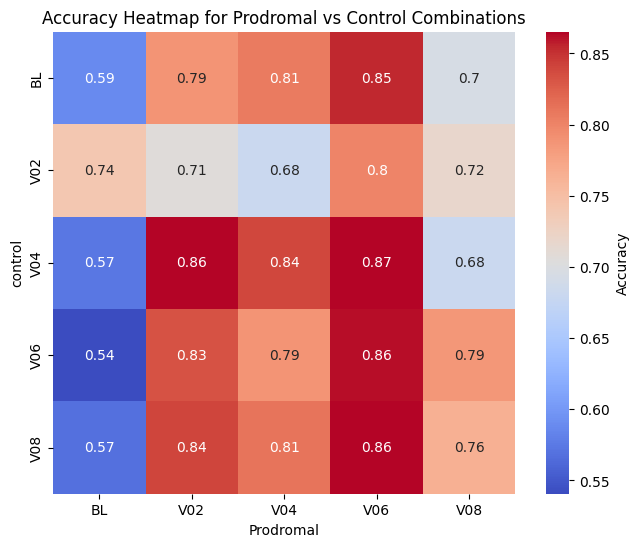

In [75]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

pro = []
Control= []
acc = []
for i,j in tqdm(ACCURACY_DICT.items()):
    pro.append(i.split('_')[1])
    Control.append(i.split('_')[-1])
    acc.append(j)


accuracy_table_pro_control = pd.DataFrame([pro,Control,acc]).T
accuracy_table_pro_control  = accuracy_table_pro_control .rename(columns = {0:'Prodromal', 1:'control', 2: 'Accuracy'})

accuracy_table_pro_control['Accuracy'] = accuracy_table_pro_control['Accuracy'].astype(float)
heatmap_data_ = accuracy_table_pro_control.pivot(index="control", columns="Prodromal", values="Accuracy")

# Plot the heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(heatmap_data_, annot=True, cmap="coolwarm", square=True, cbar_kws={'label': 'Accuracy'})
plt.title("Accuracy Heatmap for Prodromal vs Control Combinations")
plt.savefig("../heatmaps_plots/accuracy_heatmaps/smaller_con_vs_pro_accuracy_heatmap.svg", format='svg')

plt.show()

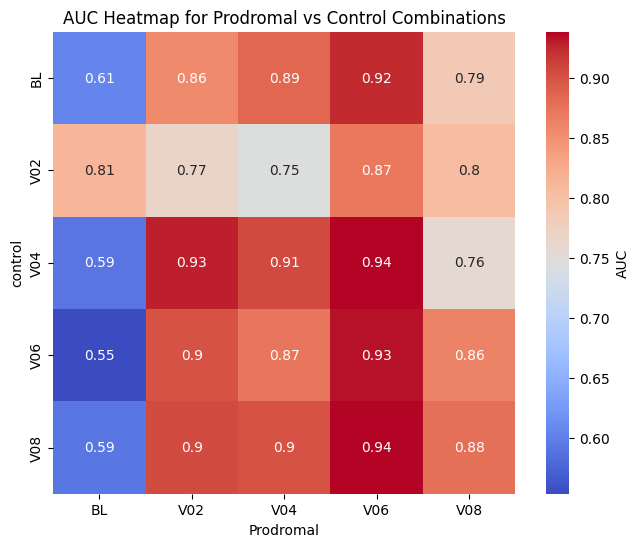

In [78]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

pro = []
Control= []
auc = []
for i,j in AUC_SCORES.items():
    pro.append(i.split('_')[1])
    Control.append(i.split('_')[-1])
    auc.append(j)


auc_table_pro_control = pd.DataFrame([pro,Control,auc]).T
auc_table_pro_control  = auc_table_pro_control.rename(columns = {0:'Prodromal', 1:'control', 2: 'AUC'})

auc_table_pro_control['AUC'] = auc_table_pro_control['AUC'].astype(float)
heatmap_data_ = auc_table_pro_control.pivot(index="control", columns="Prodromal", values="AUC")

# Plot the heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(heatmap_data_, annot=True, cmap="coolwarm", square=True, cbar_kws={'label': 'AUC'})
plt.title("AUC Heatmap for Prodromal vs Control Combinations")
plt.savefig("../heatmaps_plots/auc_heatmaps/smaller_con_vs_pro_auc_heatmap.svg", format='svg')

plt.show()

In [67]:
#FEATURE_IMPORTANCES['Prodromal_V08_Control_V08']
#sorted_0_dict_FEATURE_IMPORTANCES_asc = dict(sorted(FEATURE_IMPORTANCES['Prodromal_V08_Control_V08'].items(), key=lambda item: item[1]))

In [68]:
#sorted_0_dict_FEATURE_IMPORTANCES_asc

In [69]:
sorted_2_dict_FEATURE_IMPORTANCES_asc = dict(sorted(FEATURE_IMPORTANCES['Prodromal_V08_Control_V08_1'].items(), key=lambda item: item[1]))
sorted_2_dict_FEATURE_IMPORTANCES_asc

{'ENSG00000070501': -0.4024272582728771,
 'ENSG00000253729': -0.36654730236284244,
 'ENSG00000100387': -0.3025439404020055,
 'ENSG00000163840': -0.17363321168339219,
 'ENSG00000155229': -0.16921255814328579,
 'ENSG00000152457': -0.16850737280297257,
 'ENSG00000148229': -0.16822546555501988,
 'ENSG00000077514': -0.16296754805106975,
 'ENSG00000129484': -0.11157829234634324,
 'ENSG00000170734': -0.10723770972647304,
 'ENSG00000188486': -0.10590222788540048,
 'ENSG00000177084': -0.10355208969255443,
 'ENSG00000163161': -0.10337435904964828,
 'ENSG00000116670': -0.09877875345911474,
 'ENSG00000140398': -0.09778728990278597,
 'ENSG00000171984': -0.09694321724751918,
 'ENSG00000136936': -0.09626108722447033,
 'ENSG00000164306': -0.09447103374153255,
 'ENSG00000119318': -0.09428555294008768,
 'ENSG00000154767': -0.0936788287934522,
 'ENSG00000100479': -0.08807198126083202,
 'ENSG00000100823': -0.0774696513429474,
 'ENSG00000167986': -0.07495237091414154,
 'ENSG00000110768': -0.073268650977305

In [70]:
data.DIAGNOSIS.value_counts()

DIAGNOSIS
PD           1716
Control       869
Prodromal     254
Name: count, dtype: int64

In [71]:
data['DIAGNOSIS_2'] = data['DIAGNOSIS']

/tmp/ipykernel_173775/3022521848.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['DIAGNOSIS_2'] = data['DIAGNOSIS']


In [72]:
data['DIAGNOSIS'].replace({'Control': '1.Control', 'Prodromal': '2.Prodromal', 'PD': '3.PD'}, inplace=True)

/tmp/ipykernel_173775/960865595.py:1: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  data['DIAGNOSIS'].replace({'Control': '1.Control', 'Prodromal': '2.Prodromal', 'PD': '3.PD'}, inplace=True)
/tmp/ipykernel_173775/960865595.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['DIAGNOSIS'].replace({'Control': '1.Control', 'Prodromal': '2.Pr

In [73]:
data['New_Time_Point'] = data['DIAGNOSIS'] + '_' + data['Time_Point']
data['New_Time_Point_2'] = data['DIAGNOSIS_2'] + '_' + data['Time_Point']

/tmp/ipykernel_173775/3372653969.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['New_Time_Point'] = data['DIAGNOSIS'] + '_' + data['Time_Point']
/tmp/ipykernel_173775/3372653969.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['New_Time_Point_2'] = data['DIAGNOSIS_2'] + '_' + data['Time_Point']


In [74]:
data = data.sort_values(by = 'New_Time_Point')

In [75]:
tmp_data = data[data.Time_Point !='V02']

In [76]:
tmp_data

,DIAGNOSIS,Patient_Name,Time_Point,ENSG00000163161,ENSG00000076924,ENSG00000140398,ENSG00000073050,ENSG00000122678,ENSG00000170734,ENSG00000145736,...,ENSG00000155229,ENSG00000152457,ENSG00000111358,ENSG00000012061,ENSG00000100479,ENSG00000174405,ENSG00000122376,DIAGNOSIS_2,New_Time_Point,New_Time_Point_2
2979,1.Control,4067,BL,8.75441,3.215900,3.484700,2.035290,10.62350,4.407360,18.71180,...,14.87160,12.28000,6.37008,13.99020,2.099260,3.49413,5.15529,Control,1.Control_BL,Control_BL
1675,1.Control,3555,BL,8.62606,2.991620,2.444060,1.216600,9.92937,2.109830,17.31590,...,13.02780,14.65090,4.31114,16.54040,1.762680,3.74447,4.43577,Control,1.Control_BL,Control_BL
1672,1.Control,3554,BL,8.36324,3.413750,2.980860,2.405860,13.06600,2.406540,19.89450,...,11.48290,13.07550,4.60632,11.69110,3.538460,4.65698,5.94589,Control,1.Control_BL,Control_BL
1663,1.Control,3551,BL,16.13210,4.493290,4.687420,3.727640,24.82980,3.472790,33.00710,...,24.31030,26.06830,9.43585,12.51780,4.449960,5.52086,8.17424,Control,1.Control_BL,Control_BL
1844,1.Control,3614,BL,6.96584,2.016200,3.041110,1.151370,10.01780,2.106320,12.09810,...,9.27163,12.74720,5.48720,7.55350,5.083690,2.82238,5.12512,Control,1.Control_BL,Control_BL
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1047,3.PD,3352,V08,2.73787,0.852898,0.593909,0.512142,2.56707,0.850344,4.19096,...,3.73836,2.60706,1.63987,4.80693,0.664967,1.04419,1.38863,PD,3.PD_V08,PD_V08
3260,3.PD,4099,V08,9.30583,2.655750,3.283580,1.627710,10.70670,3.177690,32.45050,...,13.97200,14.12540,10.13750,13.82390,2.458040,4.21143,5.36266,PD,3.PD_V08,PD_V08
578,3.PD,3154,V08,8.59074,2.670000,3.657460,1.270470,7.96253,2.831450,18.96080,...,12.89770,12.59130,6.85926,12.87640,1.481610,3.69830,6.47733,PD,3.PD_V08,PD_V08
1992,3.PD,3700,V08,6.89777,1.957800,2.410730,1.416210,9.99846,3.371200,15.07030,...,9.51847,10.58750,5.70239,9.62450,3.861190,3.56683,5.18226,PD,3.PD_V08,PD_V08


In [77]:
df = pd.DataFrame(sorted_2_dict_FEATURE_IMPORTANCES_asc.items())
df[2] = np.abs(df[1])
df = df.sort_values(by = 2, ascending=False)
df

,0,1,2
0,ENSG00000070501,-0.402427,0.402427
1,ENSG00000253729,-0.366547,0.366547
2,ENSG00000100387,-0.302544,0.302544
95,ENSG00000101751,0.273704,0.273704
94,ENSG00000175482,0.224105,0.224105
...,...,...,...
52,ENSG00000178460,-0.003574,0.003574
56,ENSG00000179262,0.002832,0.002832
55,ENSG00000145736,0.002686,0.002686
53,ENSG00000062822,-0.001878,0.001878


In [78]:
tmp_data

,DIAGNOSIS,Patient_Name,Time_Point,ENSG00000163161,ENSG00000076924,ENSG00000140398,ENSG00000073050,ENSG00000122678,ENSG00000170734,ENSG00000145736,...,ENSG00000155229,ENSG00000152457,ENSG00000111358,ENSG00000012061,ENSG00000100479,ENSG00000174405,ENSG00000122376,DIAGNOSIS_2,New_Time_Point,New_Time_Point_2
2979,1.Control,4067,BL,8.75441,3.215900,3.484700,2.035290,10.62350,4.407360,18.71180,...,14.87160,12.28000,6.37008,13.99020,2.099260,3.49413,5.15529,Control,1.Control_BL,Control_BL
1675,1.Control,3555,BL,8.62606,2.991620,2.444060,1.216600,9.92937,2.109830,17.31590,...,13.02780,14.65090,4.31114,16.54040,1.762680,3.74447,4.43577,Control,1.Control_BL,Control_BL
1672,1.Control,3554,BL,8.36324,3.413750,2.980860,2.405860,13.06600,2.406540,19.89450,...,11.48290,13.07550,4.60632,11.69110,3.538460,4.65698,5.94589,Control,1.Control_BL,Control_BL
1663,1.Control,3551,BL,16.13210,4.493290,4.687420,3.727640,24.82980,3.472790,33.00710,...,24.31030,26.06830,9.43585,12.51780,4.449960,5.52086,8.17424,Control,1.Control_BL,Control_BL
1844,1.Control,3614,BL,6.96584,2.016200,3.041110,1.151370,10.01780,2.106320,12.09810,...,9.27163,12.74720,5.48720,7.55350,5.083690,2.82238,5.12512,Control,1.Control_BL,Control_BL
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1047,3.PD,3352,V08,2.73787,0.852898,0.593909,0.512142,2.56707,0.850344,4.19096,...,3.73836,2.60706,1.63987,4.80693,0.664967,1.04419,1.38863,PD,3.PD_V08,PD_V08
3260,3.PD,4099,V08,9.30583,2.655750,3.283580,1.627710,10.70670,3.177690,32.45050,...,13.97200,14.12540,10.13750,13.82390,2.458040,4.21143,5.36266,PD,3.PD_V08,PD_V08
578,3.PD,3154,V08,8.59074,2.670000,3.657460,1.270470,7.96253,2.831450,18.96080,...,12.89770,12.59130,6.85926,12.87640,1.481610,3.69830,6.47733,PD,3.PD_V08,PD_V08
1992,3.PD,3700,V08,6.89777,1.957800,2.410730,1.416210,9.99846,3.371200,15.07030,...,9.51847,10.58750,5.70239,9.62450,3.861190,3.56683,5.18226,PD,3.PD_V08,PD_V08


In [79]:
tmp_data.New_Time_Point_2.unique()

array(['Control_BL', 'Control_V04', 'Control_V06', 'Control_V08',
       'Prodromal_BL', 'Prodromal_V04', 'Prodromal_V06', 'Prodromal_V08',
       'PD_BL', 'PD_V04', 'PD_V06', 'PD_V08'], dtype=object)

In [80]:
genes = df[0].values.tolist()

In [81]:
control_tmp_data = tmp_data[tmp_data['New_Time_Point_2'].str.startswith('Control')]
control_tmp_data = control_tmp_data.sort_values(by = 'New_Time_Point') 
control_tmp_data

,DIAGNOSIS,Patient_Name,Time_Point,ENSG00000163161,ENSG00000076924,ENSG00000140398,ENSG00000073050,ENSG00000122678,ENSG00000170734,ENSG00000145736,...,ENSG00000155229,ENSG00000152457,ENSG00000111358,ENSG00000012061,ENSG00000100479,ENSG00000174405,ENSG00000122376,DIAGNOSIS_2,New_Time_Point,New_Time_Point_2
2979,1.Control,4067,BL,8.75441,3.215900,3.484700,2.035290,10.62350,4.40736,18.71180,...,14.87160,12.28000,6.37008,13.99020,2.09926,3.49413,5.15529,Control,1.Control_BL,Control_BL
497,1.Control,3114,BL,7.82853,2.594400,4.294630,1.903510,8.61105,3.38548,9.15159,...,12.84220,10.47620,3.71713,12.23280,1.06578,1.58337,2.68004,Control,1.Control_BL,Control_BL
782,1.Control,3222,BL,5.39141,1.657400,1.675930,0.924430,7.44826,2.11368,20.08700,...,7.94796,10.17180,3.42814,7.81752,2.13233,2.63440,3.91154,Control,1.Control_BL,Control_BL
777,1.Control,3221,BL,9.36745,3.519980,2.900860,2.244080,12.32750,2.11489,18.26290,...,14.71800,12.56470,6.20524,12.73450,2.34233,2.83539,4.84390,Control,1.Control_BL,Control_BL
596,1.Control,3161,BL,5.66741,1.915930,1.524200,1.201110,6.54497,1.50143,16.64420,...,7.54437,8.27115,4.07475,8.48289,1.53405,1.66240,2.58857,Control,1.Control_BL,Control_BL
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1090,1.Control,3361,V08,8.94036,2.600460,2.600350,2.013440,11.06000,2.32156,21.83440,...,12.44560,11.01350,4.63190,15.02840,2.86132,2.47932,2.42904,Control,1.Control_V08,Control_V08
1722,1.Control,3570,V08,9.60197,3.160430,2.023230,1.641220,10.53490,2.19212,23.04900,...,13.68600,14.62600,5.14603,11.98810,2.81616,3.47929,4.81438,Control,1.Control_V08,Control_V08
1598,1.Control,3523,V08,4.61276,0.695205,0.903771,0.643387,4.22710,2.15892,14.64160,...,6.40831,5.21174,2.92016,3.04272,3.80073,1.71584,3.38469,Control,1.Control_V08,Control_V08
2498,1.Control,3950,V08,9.92814,5.441090,5.286540,3.499200,13.66110,2.44580,23.37840,...,16.18550,10.10030,3.81716,22.74440,3.27309,1.49871,2.94086,Control,1.Control_V08,Control_V08


In [82]:
def return_gene_name(ensembleid):

    try:
        return results[results['Gene stable ID'] == ensembleid]['Gene name'].values[0]
    except:
        print(ensembleid)
        return ensembleid


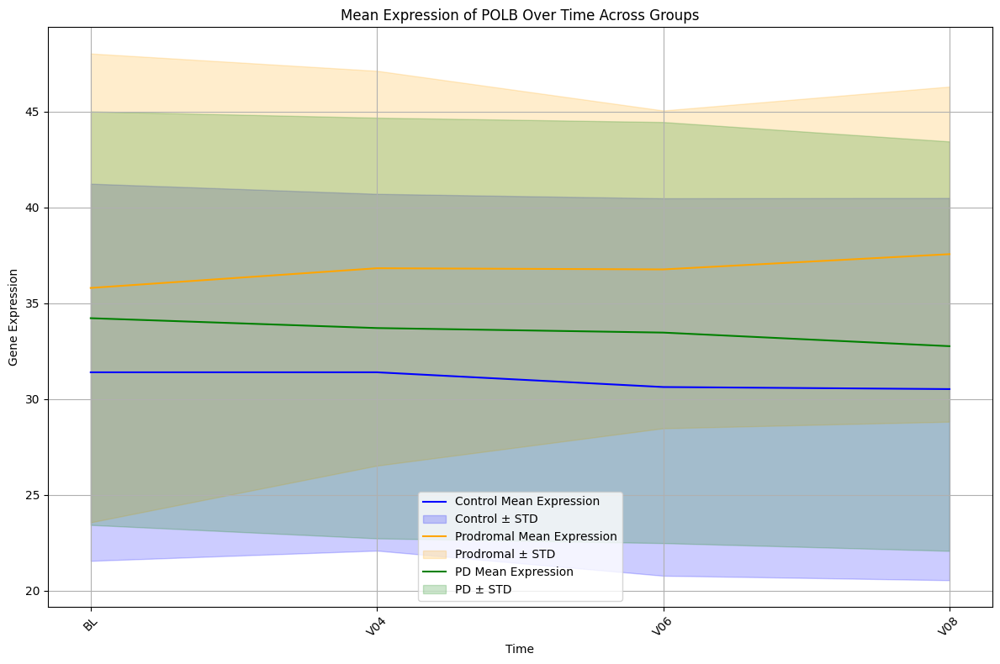

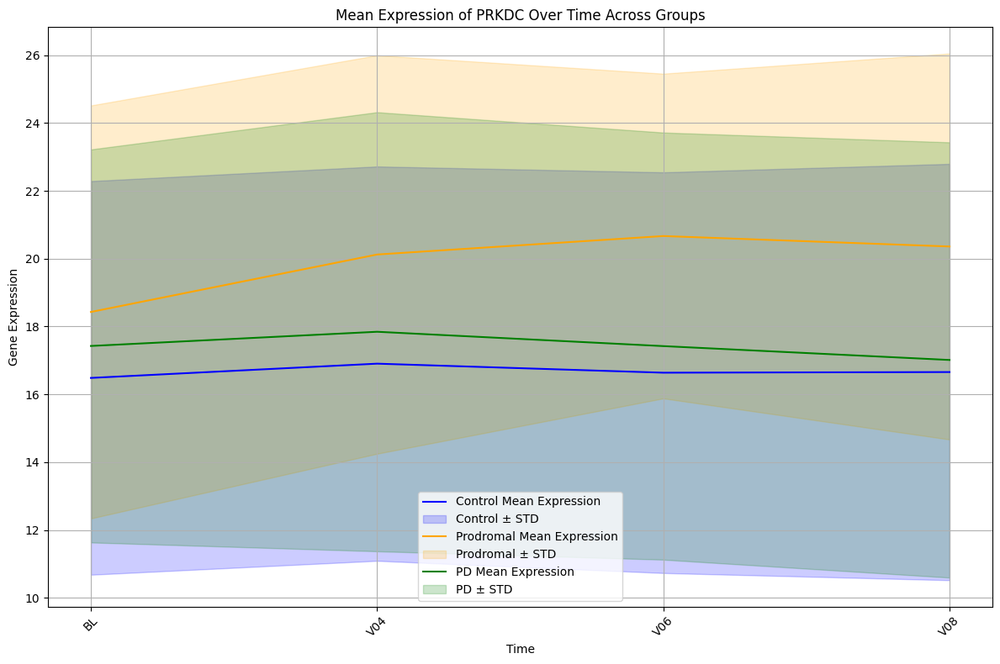

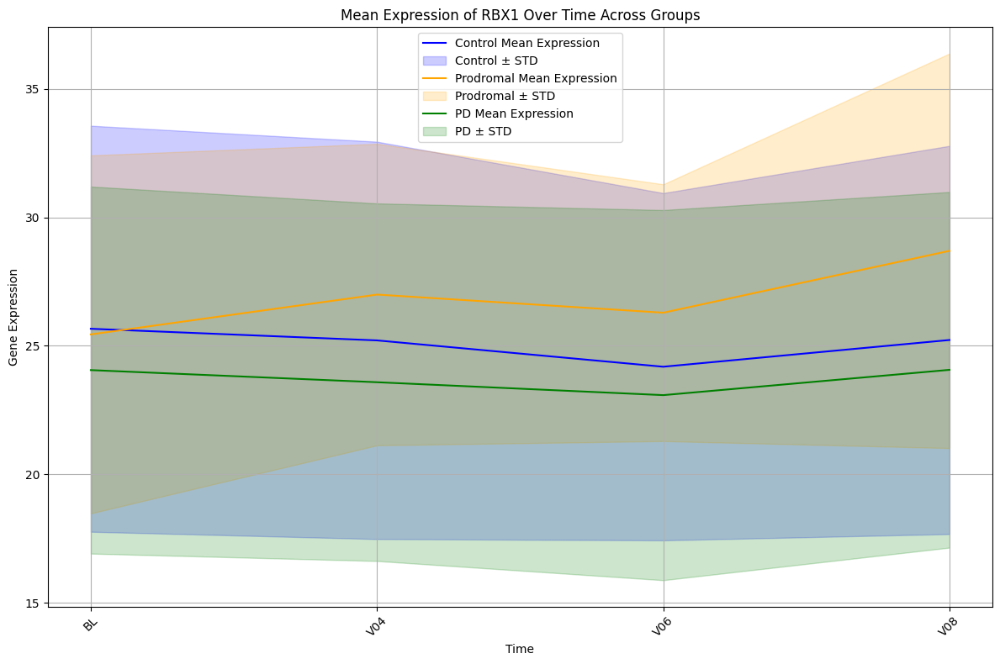

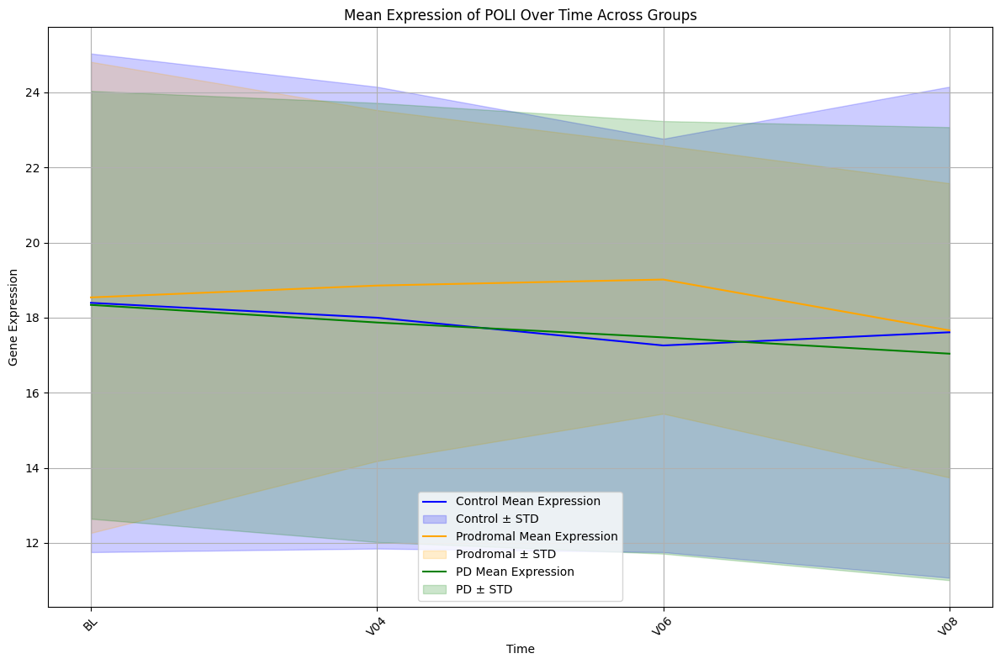

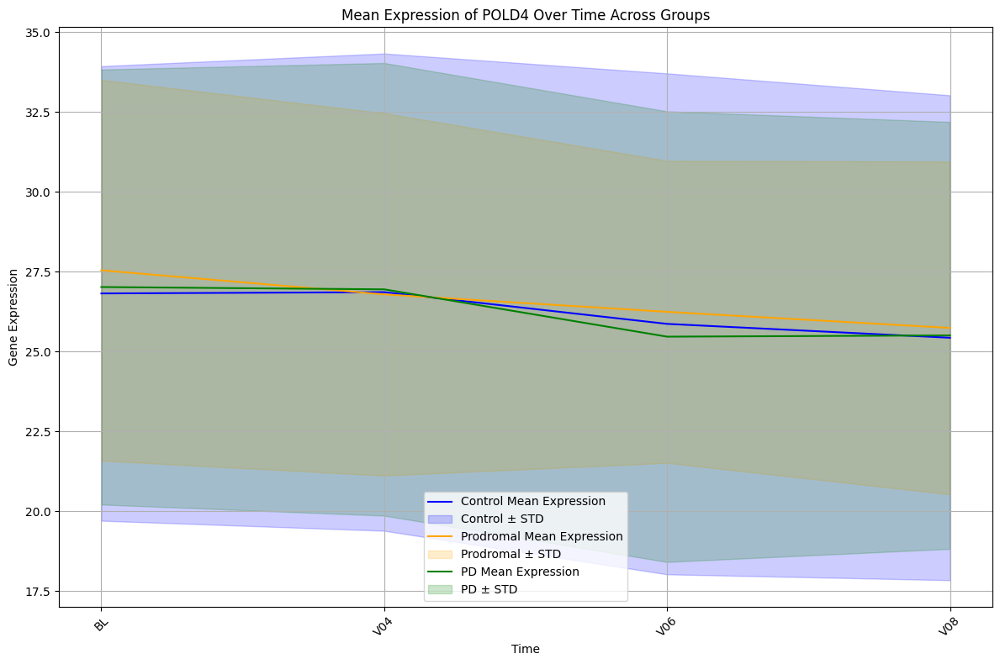

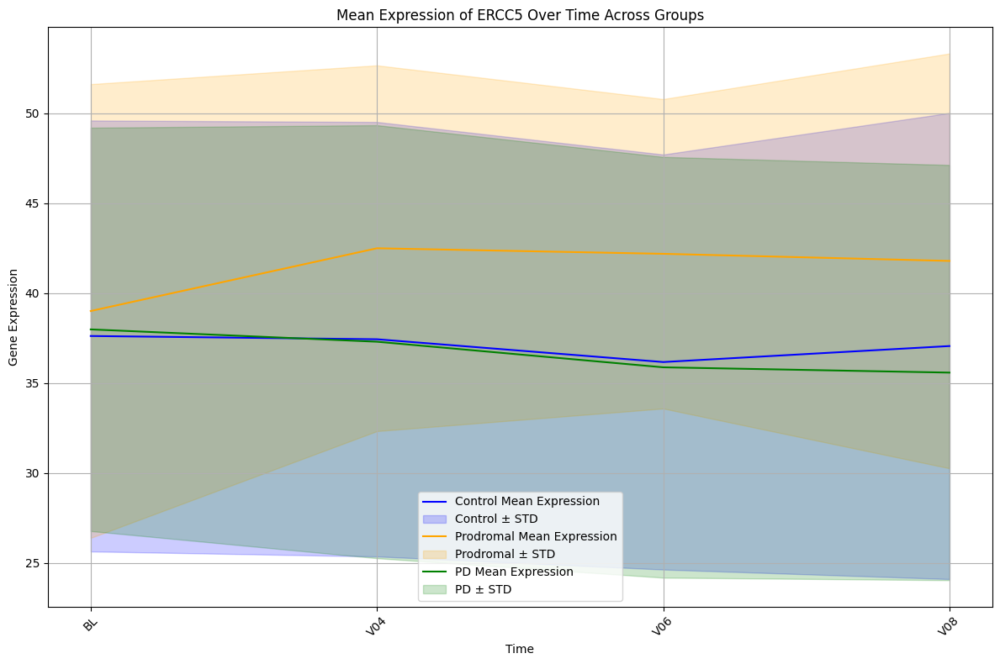

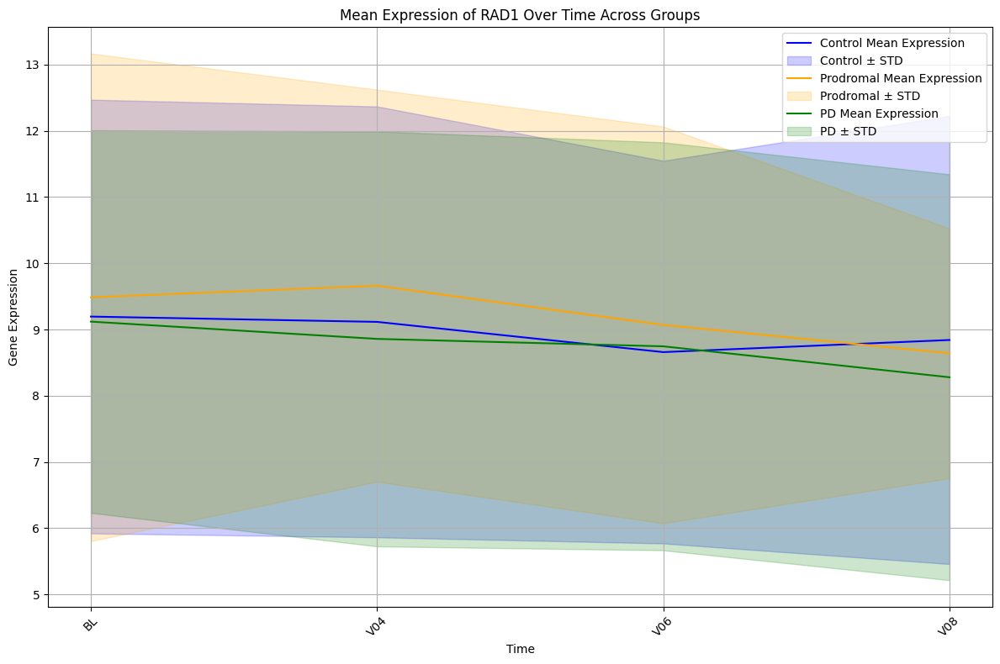

ENSG00000163840


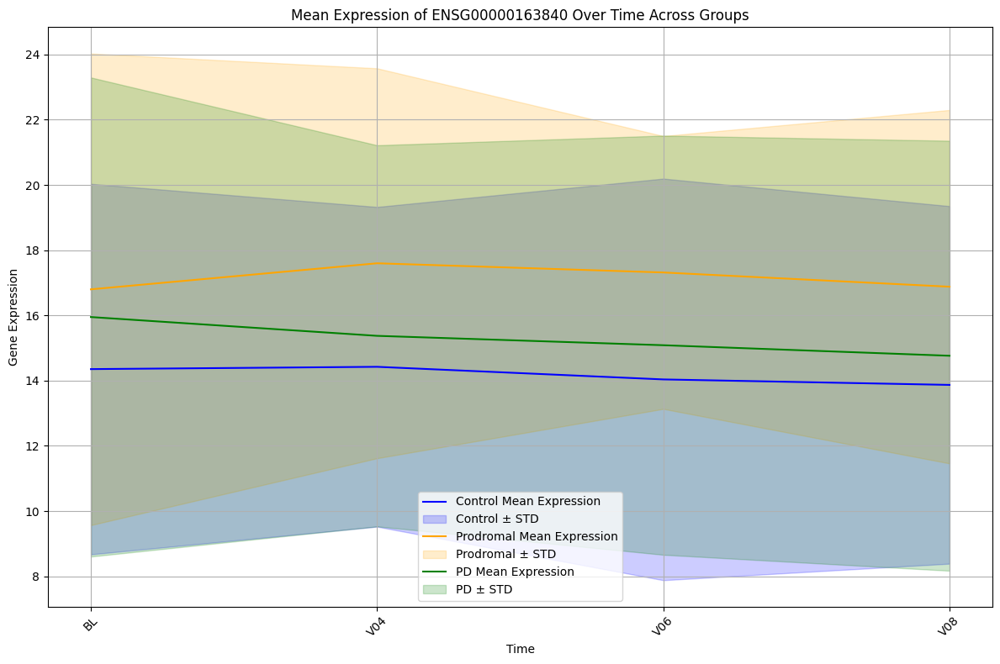

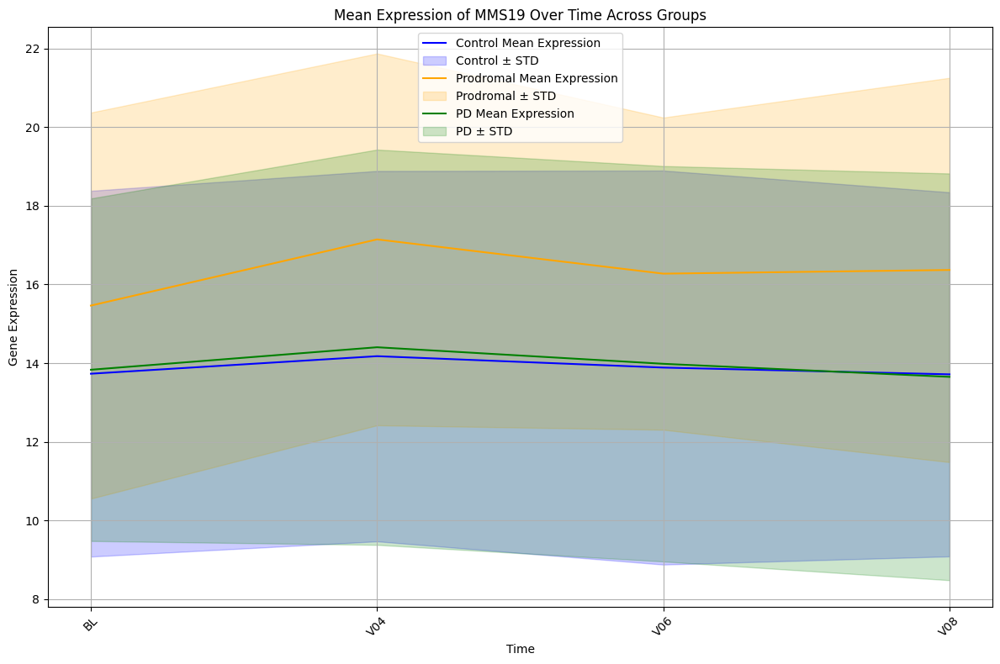

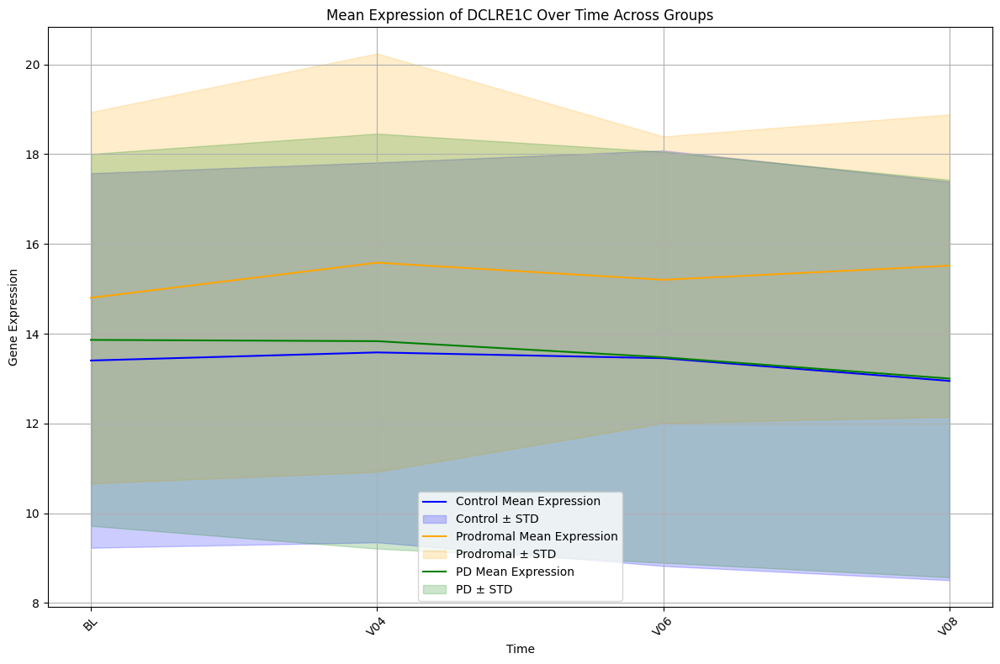

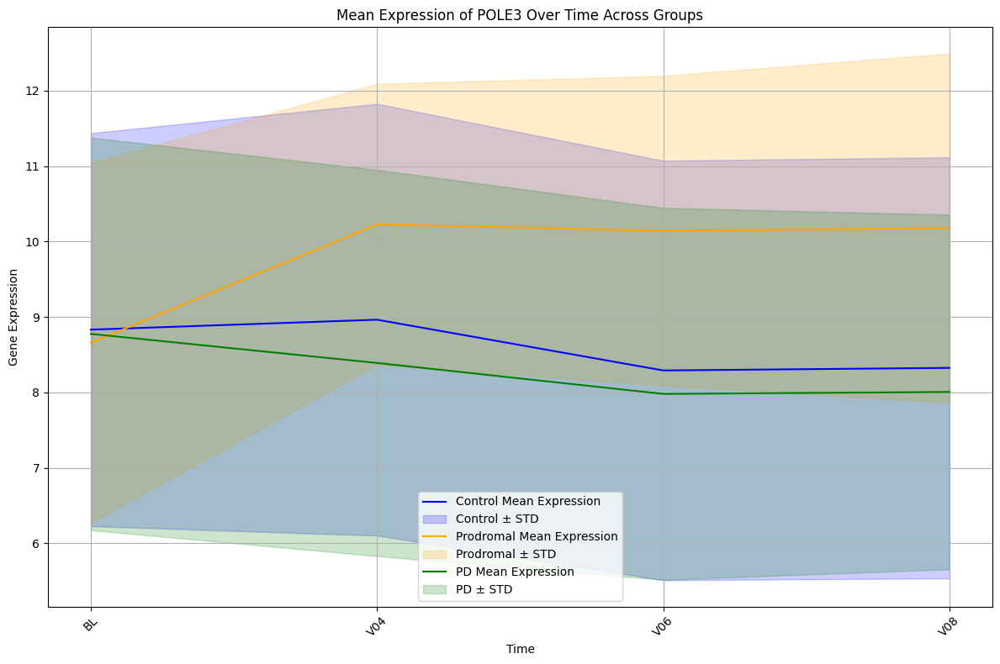

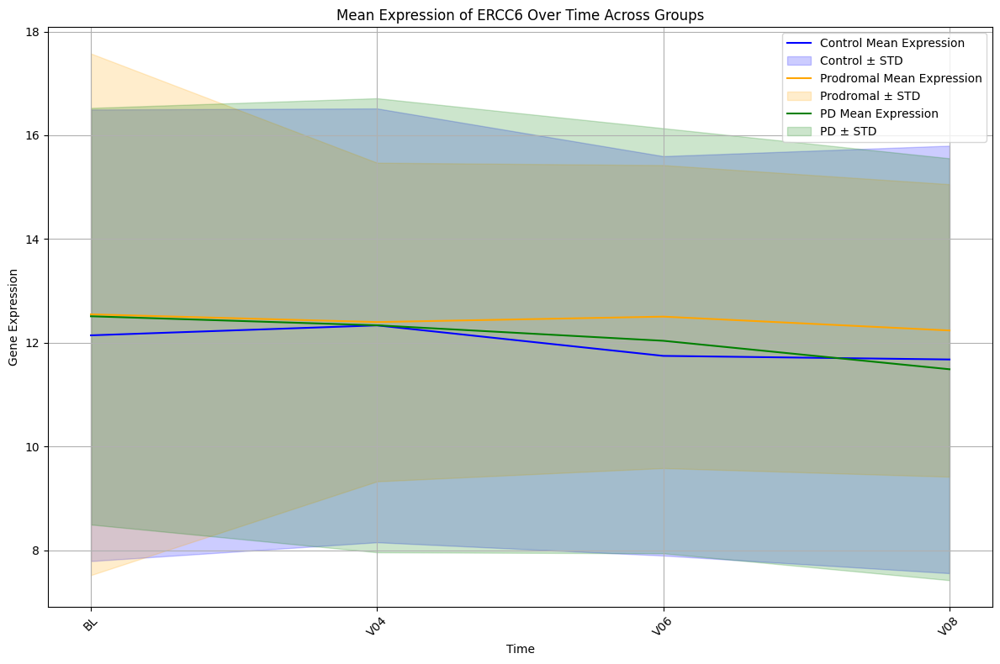

...

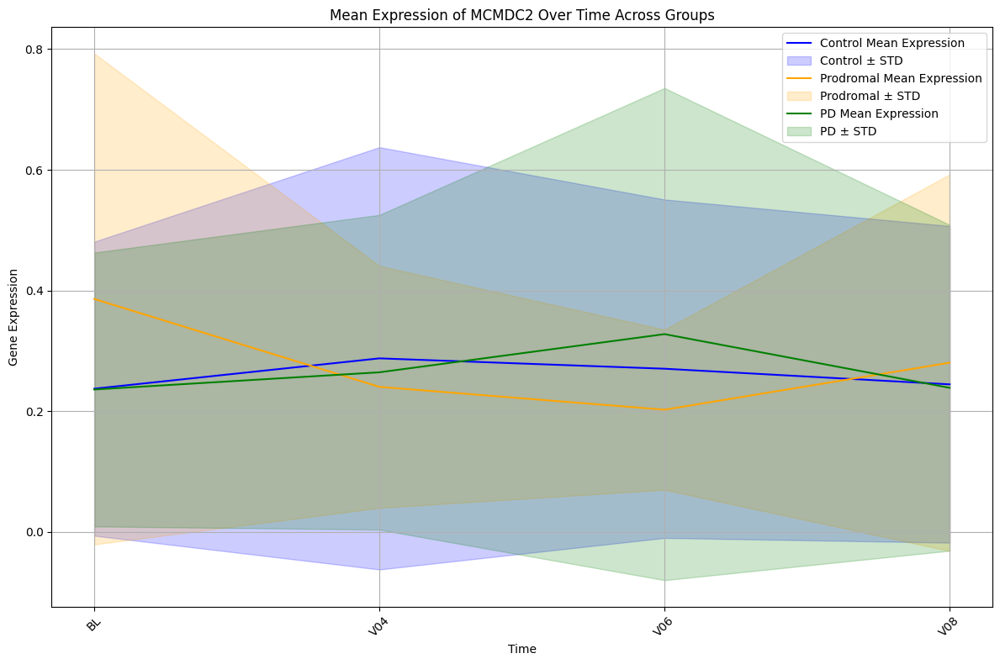

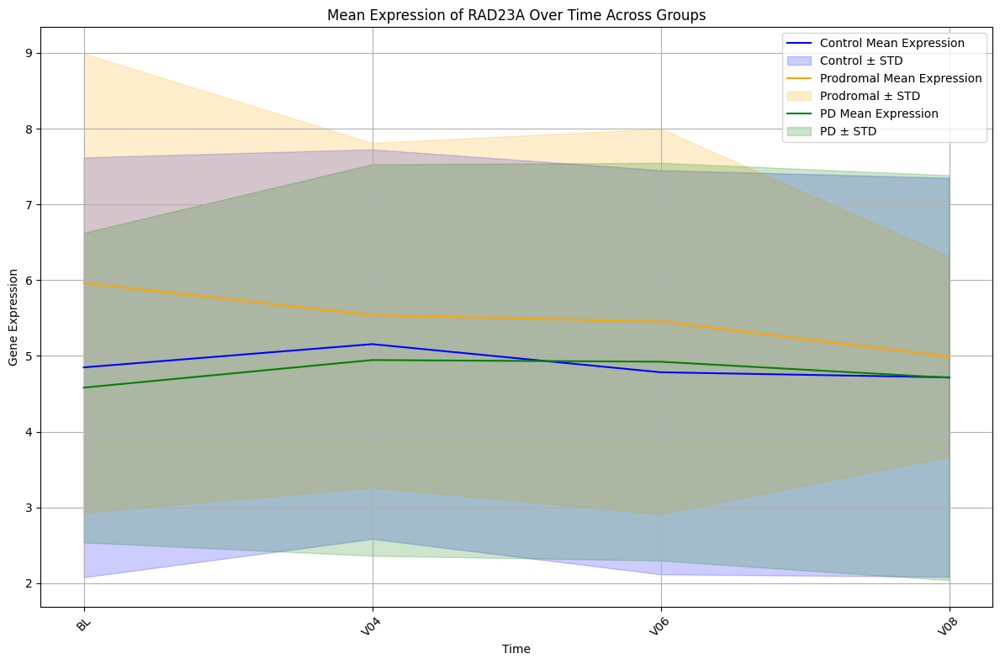

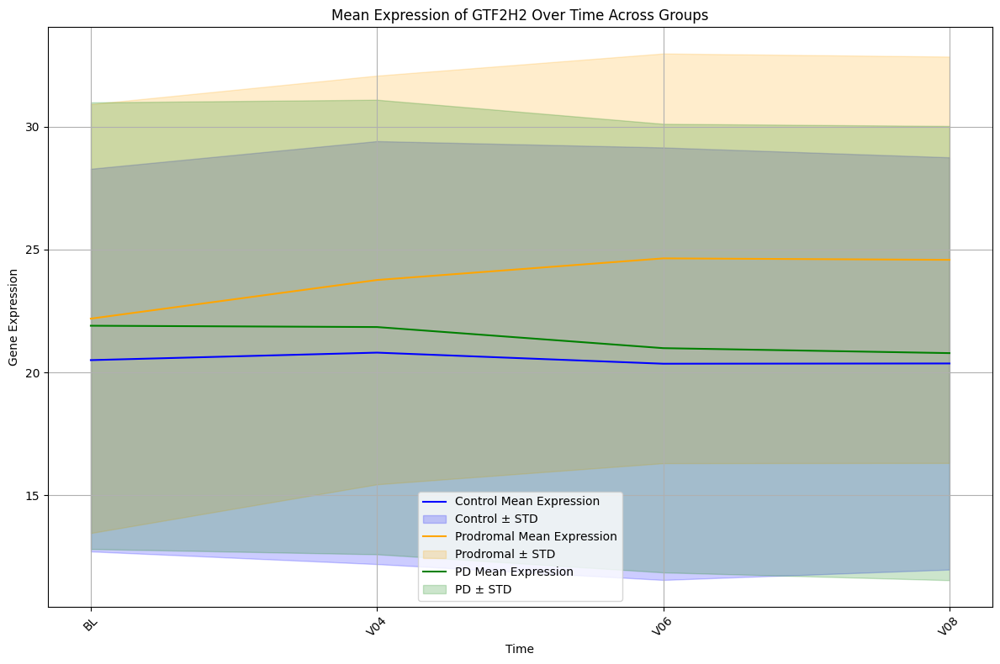

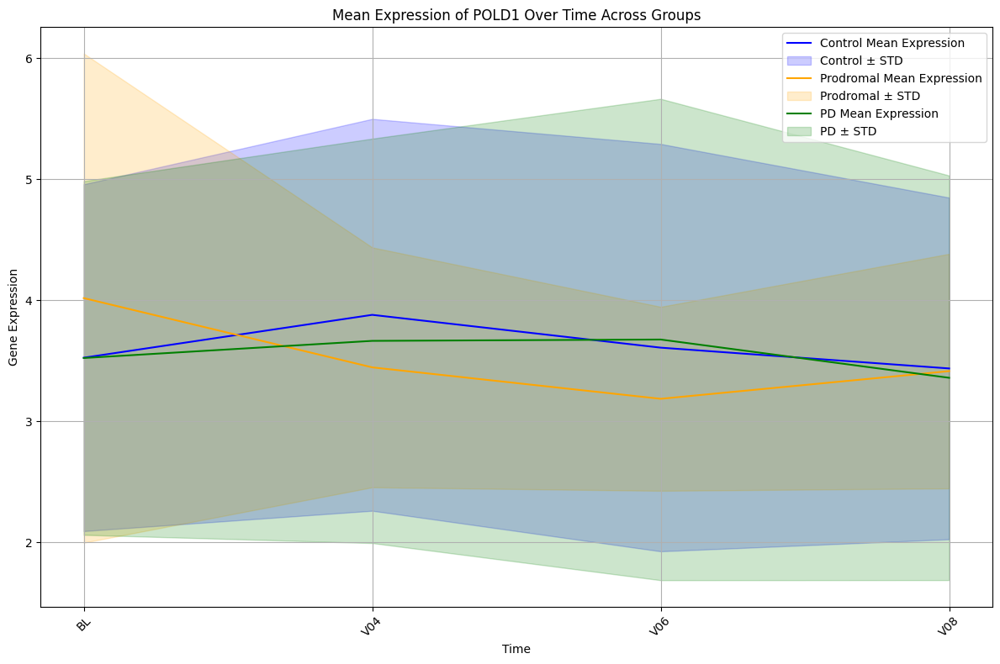

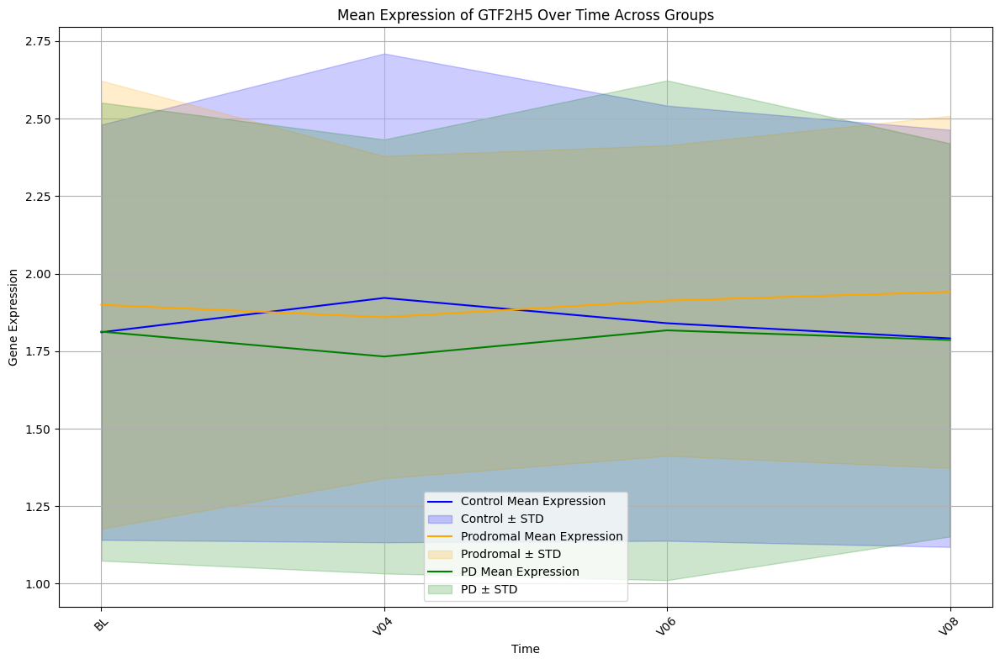

In [83]:
import matplotlib.pyplot as plt

# Loop through each gene
for gene in genes:
    # Create a new figure for each gene
    plt.figure(figsize=(12, 8))
    
    # Define a list to store the group data
    groups = ['Control', 'Prodromal', 'PD']
    colors = {'Control': 'blue', 'Prodromal': 'orange', 'PD': 'green'}
    
    for group in groups:
        # Filter and sort data by group
        group_tmp_data = tmp_data[tmp_data['New_Time_Point_2'].str.startswith(group)]
        group_tmp_data = group_tmp_data.sort_values(by='New_Time_Point')
        
        # Calculate mean and standard deviation
        mean_expression = group_tmp_data.groupby('New_Time_Point')[gene].mean()
        std_expression = group_tmp_data.groupby('New_Time_Point')[gene].std()
        
        # Extract clean time points
        index = [i.split('_')[1] for i in mean_expression.index]
        
        # Plot mean expression
        plt.plot(index, mean_expression, color=colors[group], label=f'{group} Mean Expression')
        
        # Fill the standard deviation area
        plt.fill_between(index,
                         mean_expression - std_expression,
                         mean_expression + std_expression,
                         color=colors[group], alpha=0.2, label=f'{group} ± STD')
    
    # Customize plot
    plt.xlabel('Time')
    plt.ylabel('Gene Expression')
    gene  = return_gene_name(gene)
    plt.title(f'Mean Expression of {gene} Over Time Across Groups')
    plt.xticks(rotation=45)
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    
    # Show the plot
    plt.show()



### 6. Expression of Genes with time 

In [86]:
compare_list = ['Prodromal_BL_Control_BL',  'Prodromal_V02_Control_V02' ,'Prodromal_V04_Control_V04', 'Prodromal_V06_Control_V06', 'Prodromal_V08_Control_V08']

In [87]:
FEATURE_IMPORTANCES_Prodromal_BL_Control_BL = dict()
FEATURE_IMPORTANCES_Prodromal_V02_Control_V02 = dict()
FEATURE_IMPORTANCES_Prodromal_V04_Control_V04 = dict()
FEATURE_IMPORTANCES_Prodromal_V06_Control_V06 = dict()
FEATURE_IMPORTANCES_Prodromal_V08_Control_V08 = dict()

for i in FEATURE_IMPORTANCES.keys():
    if 'Prodromal_BL_Control_BL' in i:
        FEATURE_IMPORTANCES_Prodromal_BL_Control_BL[i] = FEATURE_IMPORTANCES[i]

    elif 'Prodromal_V02_Control_V02' in i:
        FEATURE_IMPORTANCES_Prodromal_V02_Control_V02[i] = FEATURE_IMPORTANCES[i]

    elif 'Prodromal_V04_Control_V04' in i:
        FEATURE_IMPORTANCES_Prodromal_V04_Control_V04[i] = FEATURE_IMPORTANCES[i]

    elif 'Prodromal_V06_Control_V06' in i:
        FEATURE_IMPORTANCES_Prodromal_V06_Control_V06[i] = FEATURE_IMPORTANCES[i]

    elif 'Prodromal_V08_Control_V08' in i:
        FEATURE_IMPORTANCES_Prodromal_V08_Control_V08[i] = FEATURE_IMPORTANCES[i]
        
        

In [88]:
list(FEATURE_IMPORTANCES_Prodromal_BL_Control_BL.keys())[:10]

['Prodromal_BL_Control_BL_0',
 'Prodromal_BL_Control_BL_1',
 'Prodromal_BL_Control_BL_2',
 'Prodromal_BL_Control_BL_3',
 'Prodromal_BL_Control_BL_4',
 'Prodromal_BL_Control_BL_5',
 'Prodromal_BL_Control_BL_6',
 'Prodromal_BL_Control_BL_7',
 'Prodromal_BL_Control_BL_8',
 'Prodromal_BL_Control_BL_9']

In [89]:
genes_list = list(FEATURE_IMPORTANCES_Prodromal_BL_Control_BL['Prodromal_BL_Control_BL_0'].keys())

In [90]:
genes_list[0:10]

['ENSG00000163161',
 'ENSG00000076924',
 'ENSG00000140398',
 'ENSG00000073050',
 'ENSG00000122678',
 'ENSG00000170734',
 'ENSG00000145736',
 'ENSG00000138496',
 'ENSG00000198924',
 'ENSG00000079246']

In [91]:
len(FEATURE_IMPORTANCES_Prodromal_BL_Control_BL.keys())

1000

In [93]:
AVG_FEATURE_IMPORTANCES_Prodromal_BL_Control_BL = dict()
for i in genes_list:
    s = 0
    for k in FEATURE_IMPORTANCES_Prodromal_BL_Control_BL.keys():
        s += FEATURE_IMPORTANCES_Prodromal_BL_Control_BL[k][i]
    s = s/len(FEATURE_IMPORTANCES_Prodromal_BL_Control_BL.keys())
    AVG_FEATURE_IMPORTANCES_Prodromal_BL_Control_BL[i] = s


AVG_FEATURE_IMPORTANCES_Prodromal_V02_Control_V02 = dict()
for i in genes_list:
    s = 0
    for k in FEATURE_IMPORTANCES_Prodromal_V02_Control_V02.keys():
        s += FEATURE_IMPORTANCES_Prodromal_V02_Control_V02[k][i]
    s = s/len(FEATURE_IMPORTANCES_Prodromal_V02_Control_V02.keys())
    AVG_FEATURE_IMPORTANCES_Prodromal_V02_Control_V02[i] = s


AVG_FEATURE_IMPORTANCES_Prodromal_V04_Control_V04 = dict()
for i in genes_list:
    s = 0
    for k in FEATURE_IMPORTANCES_Prodromal_V04_Control_V04.keys():
        s += FEATURE_IMPORTANCES_Prodromal_V04_Control_V04[k][i]
    s = s/len(FEATURE_IMPORTANCES_Prodromal_V04_Control_V04.keys())
    AVG_FEATURE_IMPORTANCES_Prodromal_V04_Control_V04[i] = s


AVG_FEATURE_IMPORTANCES_Prodromal_V06_Control_V06 = dict()
for i in genes_list:
    s = 0
    for k in FEATURE_IMPORTANCES_Prodromal_V06_Control_V06.keys():
        s += FEATURE_IMPORTANCES_Prodromal_V06_Control_V06[k][i]
    s = s/len(FEATURE_IMPORTANCES_Prodromal_V06_Control_V06.keys())
    AVG_FEATURE_IMPORTANCES_Prodromal_V06_Control_V06[i] = s


AVG_FEATURE_IMPORTANCES_Prodromal_V08_Control_V08 = dict()
for i in genes_list:
    s = 0
    for k in FEATURE_IMPORTANCES_Prodromal_V08_Control_V08.keys():
        s += FEATURE_IMPORTANCES_Prodromal_V08_Control_V08[k][i]
    s = s/len(FEATURE_IMPORTANCES_Prodromal_V08_Control_V08.keys())
    AVG_FEATURE_IMPORTANCES_Prodromal_V08_Control_V08[i] = s
      

In [94]:
AVG_FEATURE_IMPORTANCES_Prodromal_BL_Control_BL

{'ENSG00000163161': -0.42792456412722013,
 'ENSG00000076924': 0.043326977145056,
 'ENSG00000140398': -0.39147022198206155,
 'ENSG00000073050': 0.2306699385782463,
 'ENSG00000122678': 0.46958622421978263,
 'ENSG00000170734': -0.4451945555621603,
 'ENSG00000145736': 0.04445748859822975,
 'ENSG00000138496': -0.022166487404165606,
 'ENSG00000198924': 0.0026067595319418627,
 'ENSG00000079246': -0.007324313610989404,
 'ENSG00000175595': 0.23436080135475967,
 'ENSG00000172613': 0.251442001455518,
 'ENSG00000100823': -0.11132639642317464,
 'ENSG00000080345': -0.021580070167596676,
 'ENSG00000154328': 0.2690225899593967,
 'ENSG00000105486': -0.16739207995954797,
 'ENSG00000104884': 0.17381863574903234,
 'ENSG00000113522': -0.18241579094914046,
 'ENSG00000009413': -0.1282147836809261,
 'ENSG00000113456': -0.10464166334079854,
 'ENSG00000109674': -0.15110776765672168,
 'ENSG00000168496': -0.09101068971492658,
 'ENSG00000049167': -0.7809433623072405,
 'ENSG00000123415': -0.2551538565481554,
 'ENSG

In [95]:
AVG_FEATURE_IMPORTANCES_Prodromal_V02_Control_V02

{'ENSG00000163161': -0.6753413096296432,
 'ENSG00000076924': -0.06522478518631297,
 'ENSG00000140398': -0.380160391664373,
 'ENSG00000073050': 0.26055489969017165,
 'ENSG00000122678': -0.11176354690697701,
 'ENSG00000170734': -0.23478295570613977,
 'ENSG00000145736': 0.024634480652757546,
 'ENSG00000138496': -0.30454580389988606,
 'ENSG00000198924': -0.040237452905745846,
 'ENSG00000079246': -0.15168287667845864,
 'ENSG00000175595': 0.42659768991016844,
 'ENSG00000172613': -0.03544374455538478,
 'ENSG00000100823': -0.09623341284844988,
 'ENSG00000080345': 0.1496770009872865,
 'ENSG00000154328': 0.4223530172526381,
 'ENSG00000105486': 0.3087727132822259,
 'ENSG00000104884': 0.02828281617481566,
 'ENSG00000113522': 0.07459926405584323,
 'ENSG00000009413': -0.2843336472255934,
 'ENSG00000113456': 0.24014904102015125,
 'ENSG00000109674': 0.2052940784013006,
 'ENSG00000168496': -0.12171107204834108,
 'ENSG00000049167': -0.3703778250476912,
 'ENSG00000123415': -0.15394179542214778,
 'ENSG000

In [96]:
FEATURE_IMPORTANCES_Prodromal_BL_Control_BL['Prodromal_BL_Control_BL_0']['ENSG00000132781']

0.6370885782225384

In [97]:
compare_list

['Prodromal_BL_Control_BL',
 'Prodromal_V02_Control_V02',
 'Prodromal_V04_Control_V04',
 'Prodromal_V06_Control_V06',
 'Prodromal_V08_Control_V08']

In [98]:
FEATURE_IMPORTANCES_MERGE = dict()
FEATURE_IMPORTANCES_MERGE['Prodromal_BL_Control_BL'] = AVG_FEATURE_IMPORTANCES_Prodromal_BL_Control_BL
FEATURE_IMPORTANCES_MERGE['Prodromal_V02_Control_V02'] = AVG_FEATURE_IMPORTANCES_Prodromal_V02_Control_V02
FEATURE_IMPORTANCES_MERGE['Prodromal_V04_Control_V04'] = AVG_FEATURE_IMPORTANCES_Prodromal_V04_Control_V04
FEATURE_IMPORTANCES_MERGE['Prodromal_V06_Control_V06'] = AVG_FEATURE_IMPORTANCES_Prodromal_V06_Control_V06
FEATURE_IMPORTANCES_MERGE['Prodromal_V08_Control_V08'] = AVG_FEATURE_IMPORTANCES_Prodromal_V08_Control_V08


In [99]:
pd.DataFrame(FEATURE_IMPORTANCES_MERGE['Prodromal_BL_Control_BL'].items())

,0,1
0,ENSG00000163161,-0.427925
1,ENSG00000076924,0.043327
2,ENSG00000140398,-0.391470
3,ENSG00000073050,0.230670
4,ENSG00000122678,0.469586
...,...,...
91,ENSG00000111358,-0.317458
92,ENSG00000012061,0.199646
93,ENSG00000100479,-0.864888
94,ENSG00000174405,0.369934


In [100]:
ranking_of_features = []
for i in compare_list:


    df = pd.DataFrame(FEATURE_IMPORTANCES_MERGE[i].items())
    df[2] = np.abs(df[1])
    df = df.sort_values(by = 2, ascending=False)
    print(df)
    ranking_of_features.append(df[0].tolist())


                  0         1         2
93  ENSG00000100479 -0.864888  0.864888
69  ENSG00000188486 -0.784223  0.784223
22  ENSG00000049167 -0.780943  0.780943
50  ENSG00000122008  0.737121  0.737121
58  ENSG00000225830  0.635700  0.635700
..              ...       ...       ...
72  ENSG00000042088  0.014178  0.014178
9   ENSG00000079246 -0.007324  0.007324
31  ENSG00000139372  0.006252  0.006252
8   ENSG00000198924  0.002607  0.002607
67  ENSG00000067369 -0.001439  0.001439

[96 rows x 3 columns]
                  0         1         2
45  ENSG00000116670 -0.781452  0.781452
0   ENSG00000163161 -0.675341  0.675341
72  ENSG00000042088  0.635064  0.635064
42  ENSG00000177084 -0.615523  0.615523
69  ENSG00000188486 -0.606633  0.606633
..              ...       ...       ...
25  ENSG00000197299  0.027151  0.027151
6   ENSG00000145736  0.024634  0.024634
64  ENSG00000178460  0.024432  0.024432
63  ENSG00000110768  0.017187  0.017187
51  ENSG00000100387 -0.014285  0.014285

[96 rows x 3 col

In [101]:
ranking_of_features[4][0:10]

['ENSG00000070501',
 'ENSG00000100387',
 'ENSG00000175482',
 'ENSG00000101751',
 'ENSG00000253729',
 'ENSG00000009413',
 'ENSG00000113456',
 'ENSG00000163840',
 'ENSG00000154767',
 'ENSG00000109674']

In [102]:
gene_lists = ranking_of_features

In [103]:
gene_lists

[['ENSG00000100479',
  'ENSG00000188486',
  'ENSG00000049167',
  'ENSG00000122008',
  'ENSG00000225830',
  'ENSG00000152457',
  'ENSG00000135945',
  'ENSG00000056050',
  'ENSG00000051341',
  'ENSG00000137074',
  'ENSG00000041880',
  'ENSG00000077514',
  'ENSG00000122678',
  'ENSG00000170734',
  'ENSG00000119318',
  'ENSG00000163161',
  'ENSG00000129484',
  'ENSG00000148229',
  'ENSG00000163945',
  'ENSG00000140398',
  'ENSG00000134574',
  'ENSG00000174405',
  'ENSG00000005156',
  'ENSG00000253251',
  'ENSG00000136936',
  'ENSG00000070501',
  'ENSG00000111358',
  'ENSG00000112130',
  'ENSG00000132781',
  'ENSG00000039650',
  'ENSG00000106628',
  'ENSG00000169188',
  'ENSG00000076248',
  'ENSG00000169621',
  'ENSG00000122376',
  'ENSG00000154328',
  'ENSG00000130997',
  'ENSG00000143799',
  'ENSG00000175482',
  'ENSG00000123415',
  'ENSG00000103152',
  'ENSG00000172613',
  'ENSG00000116670',
  'ENSG00000110768',
  'ENSG00000115350',
  'ENSG00000175595',
  'ENSG00000073050',
  'ENSG000001

In [104]:
gene_indices = {}

# Loop through each list and index each gene
for list_idx, gene_list in enumerate(gene_lists):
    for gene_idx, gene in enumerate(gene_list):
        # Initialize the gene's entry if not present
        if gene not in gene_indices:
            gene_indices[gene] = [-1] * len(gene_lists)  # Default -1 for lists where gene is absent
        # Update the index of the gene in the current list
        gene_indices[gene][list_idx] = gene_idx

# Display results
for gene, indices in gene_indices.items():
    print(f"{gene}: {indices}")

ENSG00000100479: [0, 11, 19, 73, 16]
ENSG00000188486: [1, 4, 2, 11, 26]
ENSG00000049167: [2, 14, 25, 84, 25]
ENSG00000122008: [3, 52, 16, 54, 20]
ENSG00000225830: [4, 23, 12, 0, 27]
ENSG00000152457: [5, 6, 30, 22, 13]
ENSG00000135945: [6, 89, 6, 48, 24]
ENSG00000056050: [7, 20, 60, 91, 90]
ENSG00000051341: [8, 74, 43, 61, 84]
ENSG00000137074: [9, 27, 8, 10, 63]
ENSG00000041880: [10, 46, 53, 82, 95]
ENSG00000077514: [11, 84, 70, 81, 12]
ENSG00000122678: [12, 66, 56, 43, 53]
ENSG00000170734: [13, 37, 5, 29, 28]
ENSG00000119318: [14, 15, 85, 42, 59]
ENSG00000163161: [15, 1, 50, 30, 23]
ENSG00000129484: [16, 78, 92, 40, 21]
ENSG00000148229: [17, 51, 0, 5, 10]
ENSG00000163945: [18, 85, 87, 52, 68]
ENSG00000140398: [19, 13, 39, 89, 14]
ENSG00000134574: [20, 47, 31, 58, 60]
ENSG00000174405: [21, 7, 88, 87, 61]
ENSG00000005156: [22, 17, 78, 68, 76]
ENSG00000253251: [23, 26, 37, 39, 45]
ENSG00000136936: [24, 81, 1, 38, 32]
ENSG00000070501: [25, 55, 20, 17, 0]
ENSG00000111358: [26, 30, 40, 50, 8

In [105]:
ranking_df = pd.DataFrame(gene_indices).T
ranking_df.columns = ['BL','V02','V04','V06','V08']

In [106]:
ranking_df

,BL,V02,V04,V06,V08
ENSG00000100479,0,11,19,73,16
ENSG00000188486,1,4,2,11,26
ENSG00000049167,2,14,25,84,25
ENSG00000122008,3,52,16,54,20
ENSG00000225830,4,23,12,0,27
...,...,...,...,...,...
ENSG00000042088,91,2,71,26,55
ENSG00000079246,92,57,47,78,33
ENSG00000139372,93,67,65,23,70
ENSG00000198924,94,87,63,85,80


In [107]:
ranking_df

,BL,V02,V04,V06,V08
ENSG00000100479,0,11,19,73,16
ENSG00000188486,1,4,2,11,26
ENSG00000049167,2,14,25,84,25
ENSG00000122008,3,52,16,54,20
ENSG00000225830,4,23,12,0,27
...,...,...,...,...,...
ENSG00000042088,91,2,71,26,55
ENSG00000079246,92,57,47,78,33
ENSG00000139372,93,67,65,23,70
ENSG00000198924,94,87,63,85,80


In [108]:
def return_gene_name(ensembleid):

    try:
        return results[results['Gene stable ID'] == ensembleid]['Gene name'].values[0]
    except:
        return np.nan

In [109]:
tmp_df = ranking_df.reset_index()
ranking_df['Gene_Name'] =tmp_df['index'].apply(return_gene_name).tolist()

In [110]:
ranking_df[ranking_df.Gene_Name.isna()]

,BL,V02,V04,V06,V08,Gene_Name
ENSG00000163840,61,40,27,83,7,NaN


In [111]:
ranking_df.loc['ENSG00000163840','Gene_Name'] = 'DTX3L'


In [112]:
ranking_df.set_index('Gene_Name',inplace=True)
ranking_df

,BL,V02,V04,V06,V08
Gene_Name,,,,,
POLE2,0,11,19,73,16
H2AX,1,4,2,11,26
ERCC8,2,14,25,84,25
POLK,3,52,16,54,20
ERCC6,4,23,12,0,27
...,...,...,...,...,...
TDP1,91,2,71,26,55
XRCC5,92,57,47,78,33
TDG,93,67,65,23,70


In [113]:
ranking_df.to_csv('ranking_df/smaller_control_to_prodromal_ranking_df.csv', index=True)

In [114]:
!pwd

/12tb_dsk3/PD_classifier/with_smug_1/New_Gene_sets


In [115]:
ranking_of_features

[['ENSG00000100479',
  'ENSG00000188486',
  'ENSG00000049167',
  'ENSG00000122008',
  'ENSG00000225830',
  'ENSG00000152457',
  'ENSG00000135945',
  'ENSG00000056050',
  'ENSG00000051341',
  'ENSG00000137074',
  'ENSG00000041880',
  'ENSG00000077514',
  'ENSG00000122678',
  'ENSG00000170734',
  'ENSG00000119318',
  'ENSG00000163161',
  'ENSG00000129484',
  'ENSG00000148229',
  'ENSG00000163945',
  'ENSG00000140398',
  'ENSG00000134574',
  'ENSG00000174405',
  'ENSG00000005156',
  'ENSG00000253251',
  'ENSG00000136936',
  'ENSG00000070501',
  'ENSG00000111358',
  'ENSG00000112130',
  'ENSG00000132781',
  'ENSG00000039650',
  'ENSG00000106628',
  'ENSG00000169188',
  'ENSG00000076248',
  'ENSG00000169621',
  'ENSG00000122376',
  'ENSG00000154328',
  'ENSG00000130997',
  'ENSG00000143799',
  'ENSG00000175482',
  'ENSG00000123415',
  'ENSG00000103152',
  'ENSG00000172613',
  'ENSG00000116670',
  'ENSG00000110768',
  'ENSG00000115350',
  'ENSG00000175595',
  'ENSG00000073050',
  'ENSG000001

In [116]:
subset_dict = {key: gene_indices[key] for key in ranking_of_features[4] if key in gene_indices}

print(subset_dict)

{'ENSG00000070501': [25, 55, 20, 17, 0], 'ENSG00000100387': [56, 95, 75, 37, 1], 'ENSG00000175482': [38, 31, 3, 2, 2], 'ENSG00000101751': [71, 73, 80, 88, 3], 'ENSG00000253729': [77, 38, 23, 4, 4], 'ENSG00000009413': [66, 25, 58, 6, 5], 'ENSG00000113456': [69, 35, 44, 56, 6], 'ENSG00000163840': [61, 40, 27, 83, 7], 'ENSG00000154767': [79, 59, 10, 16, 8], 'ENSG00000109674': [58, 44, 28, 57, 9], 'ENSG00000148229': [17, 51, 0, 5, 10], 'ENSG00000123415': [39, 56, 9, 28, 11], 'ENSG00000077514': [11, 84, 70, 81, 12], 'ENSG00000152457': [5, 6, 30, 22, 13], 'ENSG00000140398': [19, 13, 39, 89, 14], 'ENSG00000171984': [78, 61, 91, 55, 15], 'ENSG00000100479': [0, 11, 19, 73, 16], 'ENSG00000115350': [44, 21, 82, 14, 17], 'ENSG00000116670': [42, 0, 4, 1, 18], 'ENSG00000134899': [76, 16, 69, 31, 19], 'ENSG00000122008': [3, 52, 16, 54, 20], 'ENSG00000129484': [16, 78, 92, 40, 21], 'ENSG00000155229': [75, 5, 24, 18, 22], 'ENSG00000163161': [15, 1, 50, 30, 23], 'ENSG00000135945': [6, 89, 6, 48, 24], 'E

In [117]:
len(subset_dict)

96

In [118]:
subset_dict.values()

dict_values([[25, 55, 20, 17, 0], [56, 95, 75, 37, 1], [38, 31, 3, 2, 2], [71, 73, 80, 88, 3], [77, 38, 23, 4, 4], [66, 25, 58, 6, 5], [69, 35, 44, 56, 6], [61, 40, 27, 83, 7], [79, 59, 10, 16, 8], [58, 44, 28, 57, 9], [17, 51, 0, 5, 10], [39, 56, 9, 28, 11], [11, 84, 70, 81, 12], [5, 6, 30, 22, 13], [19, 13, 39, 89, 14], [78, 61, 91, 55, 15], [0, 11, 19, 73, 16], [44, 21, 82, 14, 17], [42, 0, 4, 1, 18], [76, 16, 69, 31, 19], [3, 52, 16, 54, 20], [16, 78, 92, 40, 21], [75, 5, 24, 18, 22], [15, 1, 50, 30, 23], [6, 89, 6, 48, 24], [2, 14, 25, 84, 25], [1, 4, 2, 11, 26], [4, 23, 12, 0, 27], [13, 37, 5, 29, 28], [81, 41, 77, 47, 29], [88, 58, 22, 19, 30], [35, 9, 11, 9, 31], [24, 81, 1, 38, 32], [92, 57, 47, 78, 33], [29, 63, 79, 59, 34], [70, 62, 46, 62, 35], [68, 3, 36, 3, 36], [85, 92, 86, 45, 37], [60, 42, 72, 63, 38], [95, 76, 7, 27, 39], [54, 60, 35, 66, 40], [90, 49, 66, 12, 41], [51, 77, 54, 7, 42], [57, 68, 26, 44, 43], [41, 88, 64, 76, 44], [23, 26, 37, 39, 45], [53, 91, 76, 53, 

In [119]:
# Original dictionary with gene rankings
'''gene_ranks = subset_dict


# Flatten the list to find the min and max values across all rankings
all_ranks = [rank for ranks in gene_ranks.values() for rank in ranks]
min_rank, max_rank = min(all_ranks), max(all_ranks)

# Normalize each ranking
normalized_gene_ranks = {
    gene: [(rank - min_rank) / (max_rank - min_rank) * 10 for rank in ranks]
    for gene, ranks in gene_ranks.items()
}

# Display the normalized rankings
for gene, normalized_ranks in normalized_gene_ranks.items():
    print(f"{gene}: {normalized_ranks}")
'''

'gene_ranks = subset_dict\n\n\n# Flatten the list to find the min and max values across all rankings\nall_ranks = [rank for ranks in gene_ranks.values() for rank in ranks]\nmin_rank, max_rank = min(all_ranks), max(all_ranks)\n\n# Normalize each ranking\nnormalized_gene_ranks = {\n    gene: [(rank - min_rank) / (max_rank - min_rank) * 10 for rank in ranks]\n    for gene, ranks in gene_ranks.items()\n}\n\n# Display the normalized rankings\nfor gene, normalized_ranks in normalized_gene_ranks.items():\n    print(f"{gene}: {normalized_ranks}")\n'

In [121]:
gene_ranks = subset_dict
df = pd.DataFrame(gene_ranks).T
df

,0,1,2,3,4
ENSG00000070501,25,55,20,17,0
ENSG00000100387,56,95,75,37,1
ENSG00000175482,38,31,3,2,2
ENSG00000101751,71,73,80,88,3
ENSG00000253729,77,38,23,4,4
...,...,...,...,...,...
ENSG00000169621,33,69,55,74,91
ENSG00000169188,31,71,51,90,92
ENSG00000105486,55,19,68,21,93
ENSG00000178460,63,93,90,80,94


In [122]:
def return_gene_name(ensembleid):

    try:
        return results[results['Gene stable ID'] == ensembleid]['Gene name'].values[0]
    except:
        return np.nan

tmp_df = df.reset_index()
df['Gene_Name'] =tmp_df['index'].apply(return_gene_name).tolist()
df.loc['ENSG00000163840','Gene_Name'] = 'DTX3L'
df.set_index('Gene_Name',inplace=True)

In [123]:
df

,0,1,2,3,4
Gene_Name,,,,,
POLB,25,55,20,17,0
RBX1,56,95,75,37,1
POLD4,38,31,3,2,2
POLI,71,73,80,88,3
PRKDC,77,38,23,4,4
...,...,...,...,...,...
APLF,33,69,55,74,91
APEX2,31,71,51,90,92
LIG1,55,19,68,21,93


In [124]:
ranked_df = df.rank(axis=0, method='min').astype(int)

print(ranked_df)

            0   1   2   3   4
Gene_Name                    
POLB       26  56  21  18   1
RBX1       57  96  76  38   2
POLD4      39  32   4   3   3
POLI       72  74  81  89   4
PRKDC      78  39  24   5   5
...        ..  ..  ..  ..  ..
APLF       34  70  56  75  92
APEX2      32  72  52  91  93
LIG1       56  20  69  22  94
MCMDC2     64  94  91  81  95
PARP3      11  47  54  83  96

[96 rows x 5 columns]


In [125]:
reversed_ranks = ranked_df .max() - ranked_df  + 1

print(reversed_ranks)

            0   1   2   3   4
Gene_Name                    
POLB       71  41  76  79  96
RBX1       40   1  21  59  95
POLD4      58  65  93  94  94
POLI       25  23  16   8  93
PRKDC      19  58  73  92  92
...        ..  ..  ..  ..  ..
APLF       63  27  41  22   5
APEX2      65  25  45   6   4
LIG1       41  77  28  75   3
MCMDC2     33   3   6  16   2
PARP3      86  50  43  14   1

[96 rows x 5 columns]


In [126]:
rank_dict = reversed_ranks.T.to_dict(orient='list')
rank_dict

{'POLB': [71, 41, 76, 79, 96],
 'RBX1': [40, 1, 21, 59, 95],
 'POLD4': [58, 65, 93, 94, 94],
 'POLI': [25, 23, 16, 8, 93],
 'PRKDC': [19, 58, 73, 92, 92],
 'REV3L': [30, 71, 38, 90, 91],
 'RAD1': [27, 61, 52, 40, 90],
 'DTX3L': [35, 56, 69, 13, 89],
 'XPC': [17, 37, 86, 80, 88],
 'NEIL3': [38, 52, 68, 39, 87],
 'POLE3': [79, 45, 96, 91, 86],
 'SMUG1': [57, 40, 87, 68, 85],
 'POLD3': [85, 12, 26, 15, 84],
 'DCLRE1C': [91, 90, 66, 74, 83],
 'NEIL1': [77, 83, 57, 7, 82],
 'SHLD1': [18, 35, 5, 41, 81],
 'POLE2': [96, 85, 77, 23, 80],
 'POLE4': [52, 75, 14, 82, 79],
 'MAD2L2': [54, 96, 92, 95, 78],
 'ERCC5': [20, 80, 27, 65, 77],
 'POLK': [93, 44, 80, 42, 76],
 'PARP2': [80, 18, 4, 56, 75],
 'MMS19': [21, 91, 72, 78, 74],
 'ERCC3': [81, 95, 46, 66, 73],
 'REV1': [90, 7, 90, 48, 72],
 'ERCC8': [94, 82, 71, 12, 71],
 'H2AX': [95, 92, 94, 85, 70],
 'ERCC6': [92, 73, 84, 96, 69],
 'POLH': [83, 59, 91, 67, 68],
 'DDB1': [15, 55, 19, 49, 67],
 'RIF1': [8, 38, 74, 77, 66],
 'NEIL2': [61, 87, 85, 8

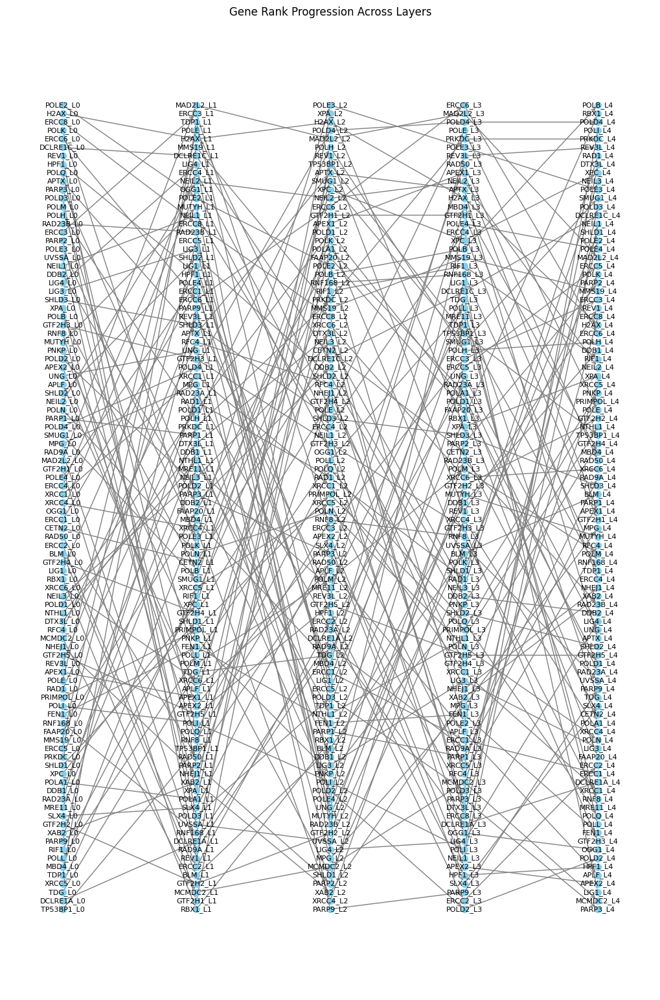

In [127]:
import matplotlib.pyplot as plt
import networkx as nx

# The rank positions for each gene across four layers
gene_ranks = rank_dict

G = nx.DiGraph()

# Number of layers
num_layers = len(next(iter(gene_ranks.values())))

# Add nodes and edges for each gene across the layers
for gene, ranks in gene_ranks.items():
    for layer in range(num_layers - 1):
        # Add nodes for the gene at each layer with unique identifiers
        current_node = f"{gene}_L{layer}"
        next_node = f"{gene}_L{layer + 1}"
        G.add_node(current_node, layer=layer, rank=ranks[layer])
        G.add_node(next_node, layer=layer + 1, rank=ranks[layer + 1])
        
        # Add a directed edge to show rank progression between layers
        G.add_edge(current_node, next_node)

# Position nodes to show each layer vertically
pos = {}
layer_spacing = 1.5  # Space between layers
rank_spacing = 0.3   # Space between ranks in a layer

for node, data in G.nodes(data=True):
    layer = data['layer']
    rank = data['rank']
    pos[node] = (layer * layer_spacing, -rank * rank_spacing)

# Draw the graph
plt.figure(figsize=(10, 15))
nx.draw(G, pos, with_labels=True, node_size=50, font_size=8, arrowstyle='->', arrowsize=10, node_color="skyblue", edge_color="gray")

plt.title("Gene Rank Progression Across Layers")
plt.xlabel("Layers")
plt.ylabel("Rank (Higher is lower on graph)")
plt.gca().invert_yaxis()  # To have higher ranks visually lower
plt.show()

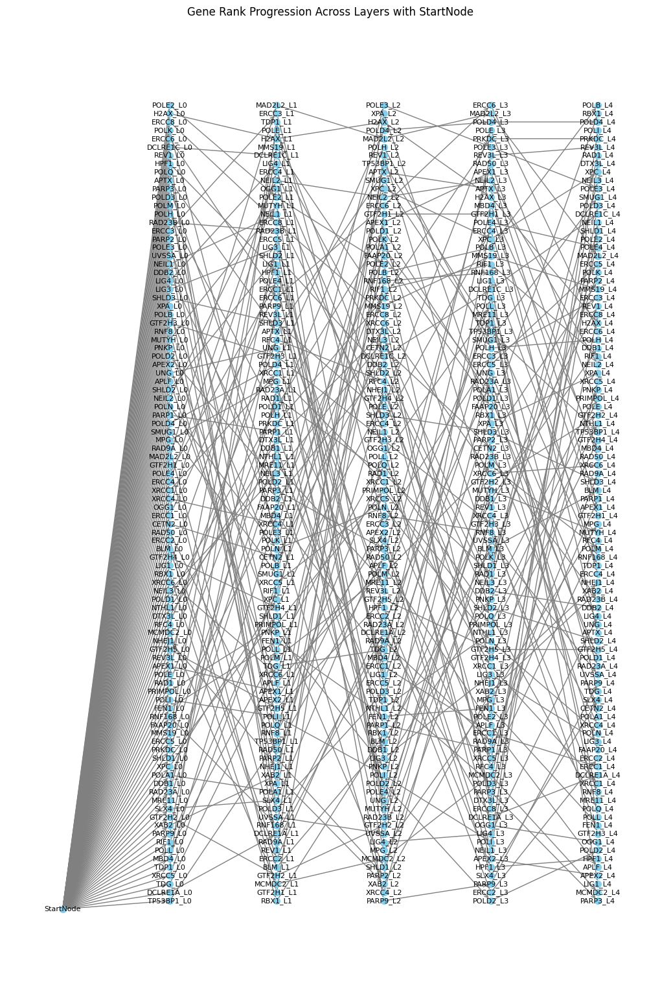

In [128]:
import matplotlib.pyplot as plt
import networkx as nx

# Example rank dictionary (you should replace this with your actual rank_dict)

# Create the directed graph
G = nx.DiGraph()

# Number of layers (based on the length of the rank list)
num_layers = len(next(iter(rank_dict.values())))

# Add the start node before the first layer
start_node = "StartNode"
G.add_node(start_node, layer=-1, rank=0)  # Layer -1 to indicate it's before the first layer

# Add nodes and edges for each gene across the layers
for gene, ranks in rank_dict.items():
    for layer in range(num_layers - 1):
        # Add nodes for the gene at each layer with unique identifiers
        current_node = f"{gene}_L{layer}"
        next_node = f"{gene}_L{layer + 1}"
        G.add_node(current_node, layer=layer, rank=ranks[layer])
        G.add_node(next_node, layer=layer + 1, rank=ranks[layer + 1])
        
        # Add a directed edge to show rank progression between layers
        G.add_edge(current_node, next_node)
    
    # Add edges from the start node to the first layer nodes
    first_layer_node = f"{gene}_L0"
    G.add_edge(start_node, first_layer_node)

# Position nodes to show each layer vertically
pos = {}
layer_spacing = 1.5  # Space between layers
rank_spacing = 0.3   # Space between ranks in a layer

for node, data in G.nodes(data=True):
    layer = data['layer']
    rank = data['rank']
    pos[node] = (layer * layer_spacing, -rank * rank_spacing)

# Draw the graph
plt.figure(figsize=(10, 15))
nx.draw(G, pos, with_labels=True, node_size=50, font_size=8, arrowstyle='->', arrowsize=10, node_color="skyblue", edge_color="gray")

# Title and labels
plt.title("Gene Rank Progression Across Layers with StartNode")
plt.xlabel("Layers")
plt.ylabel("Rank (Higher is lower on graph)")
plt.gca().invert_yaxis()  # To have higher ranks visually lower
plt.savefig("gene_rank_progression.svg", format="svg")
plt.savefig("smaller_plots/smaller_gene_ranked_prgression_control_to_prodromal.png", dpi=100)

plt.show()


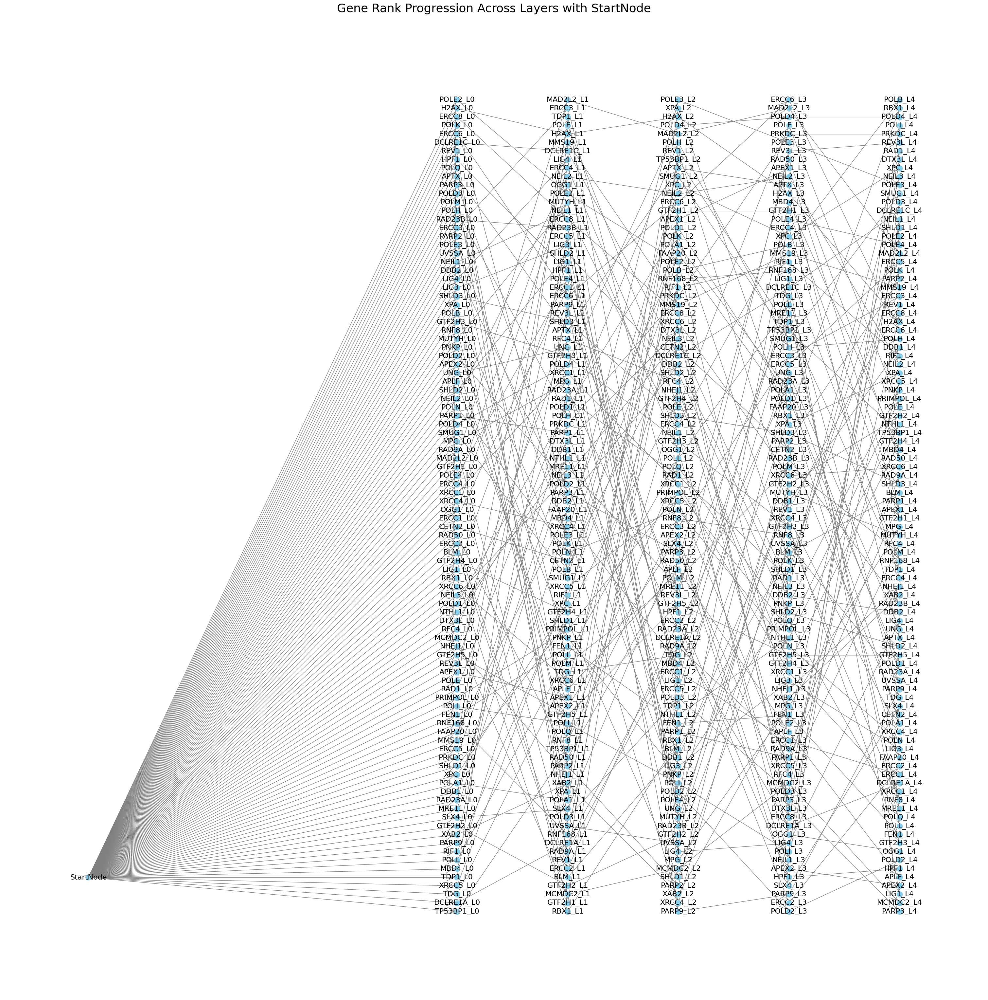

In [129]:
import matplotlib.pyplot as plt
import networkx as nx

# Example rank dictionary (you should replace this with your actual rank_dict)



# Create the directed graph
G = nx.DiGraph()

# Number of layers (based on the length of the rank list)
num_layers = len(next(iter(rank_dict.values())))

# Add the start node before the first layer
start_node = "StartNode"
G.add_node(start_node, layer=-1, rank=0)  # Layer -1 to indicate it's before the first layer

# Add nodes and edges for each gene across the layers
for gene, ranks in rank_dict.items():
    for layer in range(num_layers - 1):
        # Add nodes for the gene at each layer with unique identifiers
        current_node = f"{gene}_L{layer}"
        next_node = f"{gene}_L{layer + 1}"
        G.add_node(current_node, layer=layer, rank=ranks[layer])
        G.add_node(next_node, layer=layer + 1, rank=ranks[layer + 1])
        
        # Add a directed edge to show rank progression between layers
        G.add_edge(current_node, next_node)
    
    # Add edges from the start node to the first layer nodes
    first_layer_node = f"{gene}_L0"
    G.add_edge(start_node, first_layer_node)

# Position nodes to show each layer vertically
pos = {}
layer_spacing = 1.5  # Space between layers
rank_spacing = 0.3   # Space between ranks in a layer

# Set the position of the StartNode to be at the mid-left of the first layer
start_node_x_pos = -5 # Fixed position on the left
start_node_y_pos = -1.5  # Middle of first layer vertically

# Position the nodes
for node, data in G.nodes(data=True):
    layer = data['layer']
    rank = data['rank']
    
    if layer == -1:
        # Place the StartNode on the mid-left of the first layer
        pos[node] = (start_node_x_pos, start_node_y_pos)
    else:
        # Place other nodes based on their layer and rank
        pos[node] = (layer * layer_spacing, -rank * rank_spacing)

# Draw the graph
plt.figure(figsize=(30, 30))
nx.draw(G, pos, with_labels=True, node_size=150, font_size=16, arrowstyle='->', arrowsize=40, node_color="skyblue", edge_color="gray")

# Title and labels
plt.title("Gene Rank Progression Across Layers with StartNode", fontsize=26)
plt.xlabel("Layers")
plt.ylabel("Rank (Higher is lower on graph)")
plt.gca().invert_yaxis()  # To have higher ranks visually lower

# Save the plot as an SVG file
plt.savefig("gene_rank_progression_with_start_node_left.svg", format="svg")
plt.savefig("gene_rank_progression_with_start_node_left.png", format="png")
# Show the plot
plt.show()


In [130]:
!mkdir -p feature_importance_weights/smaller_set_genes/control_vs_prodromal

def return_value(i):

    l = [AVG_FEATURE_IMPORTANCES_Prodromal_BL_Control_BL[i],AVG_FEATURE_IMPORTANCES_Prodromal_V02_Control_V02[i],
         AVG_FEATURE_IMPORTANCES_Prodromal_V04_Control_V04[i],
    AVG_FEATURE_IMPORTANCES_Prodromal_V06_Control_V06[i],AVG_FEATURE_IMPORTANCES_Prodromal_V08_Control_V08[i]]
    return l


li = []
genes = []
for i in AVG_FEATURE_IMPORTANCES_Prodromal_BL_Control_BL.keys():
    
    li.append(return_value(i))
    genes.append(i)

df = pd.DataFrame(li)
df['genes'] = genes
df = df.set_index('genes')
df.columns = ['BL','V02','V04','V06','V08']
df['Gene_Name'] =df.reset_index()['genes'].apply(return_gene_name).tolist()
df = df.set_index('Gene_Name')
df.to_csv(f'feature_importance_weights/smaller_set_genes//control_vs_prodromal/control_vs_prodromal.csv',index = True)
df


,BL,V02,V04,V06,V08
Gene_Name,,,,,
ERCC3,-0.427925,-0.675341,-0.101266,-0.180935,-0.099901
XAB2,0.043327,-0.065225,0.011526,0.037189,0.031890
NEIL1,-0.391470,-0.380160,-0.151778,0.010972,-0.137803
XRCC1,0.230670,0.260555,-0.123651,-0.042607,0.008921
POLM,0.469586,-0.111764,-0.074077,0.133245,0.037336
...,...,...,...,...,...
GTF2H3,-0.317458,0.263337,-0.149292,-0.095202,-0.003787
ERCC1,0.199646,0.305638,-0.048857,0.031350,0.011570
POLE2,-0.864888,-0.412687,-0.263441,-0.032439,-0.129964
